In [284]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from matplotlib.patches import Rectangle
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import chi2
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_white
from statsmodels.compat import lzip
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from scipy.stats import zscore
from sklearn.preprocessing import scale 
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics  
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


import warnings
warnings.filterwarnings('ignore')

In [2]:
# pip install plotly

In [3]:
df = pd.read_csv('acs2017_census_tract_data.csv')

In [4]:
df.head()

,TractId,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001020100,Alabama,Autauga County,1845,899,946,2.4,86.3,5.2,0.0,...,0.5,0.0,2.1,24.5,881,74.2,21.2,4.5,0.0,4.6
1,1001020200,Alabama,Autauga County,2172,1167,1005,1.1,41.6,54.5,0.0,...,0.0,0.5,0.0,22.2,852,75.9,15.0,9.0,0.0,3.4
2,1001020300,Alabama,Autauga County,3385,1533,1852,8.0,61.4,26.5,0.6,...,1.0,0.8,1.5,23.1,1482,73.3,21.1,4.8,0.7,4.7
3,1001020400,Alabama,Autauga County,4267,2001,2266,9.6,80.3,7.1,0.5,...,1.5,2.9,2.1,25.9,1849,75.8,19.7,4.5,0.0,6.1
4,1001020500,Alabama,Autauga County,9965,5054,4911,0.9,77.5,16.4,0.0,...,0.8,0.3,0.7,21.0,4787,71.4,24.1,4.5,0.0,2.3


In [5]:
df.columns

Index(['TractId', 'State', 'County', 'TotalPop', 'Men', 'Women', 'Hispanic',
       'White', 'Black', 'Native', 'Asian', 'Pacific', 'VotingAgeCitizen',
       'Income', 'IncomeErr', 'IncomePerCap', 'IncomePerCapErr', 'Poverty',
       'ChildPoverty', 'Professional', 'Service', 'Office', 'Construction',
       'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp',
       'WorkAtHome', 'MeanCommute', 'Employed', 'PrivateWork', 'PublicWork',
       'SelfEmployed', 'FamilyWork', 'Unemployment'],
      dtype='object')

In [6]:
df.shape

(74001, 37)

In [7]:
df.dtypes

TractId               int64
State                object
County               object
TotalPop              int64
Men                   int64
Women                 int64
Hispanic            float64
White               float64
Black               float64
Native              float64
Asian               float64
Pacific             float64
VotingAgeCitizen      int64
Income              float64
IncomeErr           float64
IncomePerCap        float64
IncomePerCapErr     float64
Poverty             float64
ChildPoverty        float64
Professional        float64
Service             float64
Office              float64
Construction        float64
Production          float64
Drive               float64
Carpool             float64
Transit             float64
Walk                float64
OtherTransp         float64
WorkAtHome          float64
MeanCommute         float64
Employed              int64
PrivateWork         float64
PublicWork          float64
SelfEmployed        float64
FamilyWork          

# Nettoyage  et transformation de données

In [8]:
df.duplicated().sum()


0

In [9]:
df.isnull().sum()

TractId                0
State                  0
County                 0
TotalPop               0
Men                    0
Women                  0
Hispanic             696
White                696
Black                696
Native               696
Asian                696
Pacific              696
VotingAgeCitizen       0
Income              1116
IncomeErr           1116
IncomePerCap         745
IncomePerCapErr      745
Poverty              842
ChildPoverty        1110
Professional         811
Service              811
Office               811
Construction         811
Production           811
Drive                801
Carpool              801
Transit              801
Walk                 801
OtherTransp          801
WorkAtHome           801
MeanCommute          946
Employed               0
PrivateWork          811
PublicWork           811
SelfEmployed         811
FamilyWork           811
Unemployment         810
dtype: int64

In [10]:
df.dropna(inplace=True)

In [11]:
df.isnull().sum()

TractId             0
State               0
County              0
TotalPop            0
Men                 0
Women               0
Hispanic            0
White               0
Black               0
Native              0
Asian               0
Pacific             0
VotingAgeCitizen    0
Income              0
IncomeErr           0
IncomePerCap        0
IncomePerCapErr     0
Poverty             0
ChildPoverty        0
Professional        0
Service             0
Office              0
Construction        0
Production          0
Drive               0
Carpool             0
Transit             0
Walk                0
OtherTransp         0
WorkAtHome          0
MeanCommute         0
Employed            0
PrivateWork         0
PublicWork          0
SelfEmployed        0
FamilyWork          0
Unemployment        0
dtype: int64

In [12]:
df.shape

(72718, 37)

In [13]:
df.head()

,TractId,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001020100,Alabama,Autauga County,1845,899,946,2.4,86.3,5.2,0.0,...,0.5,0.0,2.1,24.5,881,74.2,21.2,4.5,0.0,4.6
1,1001020200,Alabama,Autauga County,2172,1167,1005,1.1,41.6,54.5,0.0,...,0.0,0.5,0.0,22.2,852,75.9,15.0,9.0,0.0,3.4
2,1001020300,Alabama,Autauga County,3385,1533,1852,8.0,61.4,26.5,0.6,...,1.0,0.8,1.5,23.1,1482,73.3,21.1,4.8,0.7,4.7
3,1001020400,Alabama,Autauga County,4267,2001,2266,9.6,80.3,7.1,0.5,...,1.5,2.9,2.1,25.9,1849,75.8,19.7,4.5,0.0,6.1
4,1001020500,Alabama,Autauga County,9965,5054,4911,0.9,77.5,16.4,0.0,...,0.8,0.3,0.7,21.0,4787,71.4,24.1,4.5,0.0,2.3


# Exploration des données

combien y a t-ils des états

In [14]:
df.State.nunique() #Puerto Rico et la capitale sont considérés comme des états

52

In [15]:
district = df[['State','County']].groupby('State').agg('count')
district.sort_values('County', ascending=False)

,County
State,
California,7932
Texas,5197
New York,4778
Florida,4120
Pennsylvania,3174
Illinois,3105
Ohio,2931
Michigan,2726
North Carolina,2159


quelles sont les 10 états les plus peuplés

In [16]:
a1 = df.groupby('State')['TotalPop'].sum().reset_index(name ='Total')
a1.sort_values('Total', ascending=False).head(10)

,State,Total
4,California,38773436
44,Texas,27337059
9,Florida,20158603
32,New York,19664161
13,Illinois,12829297
38,Pennsylvania,12736617
35,Ohio,11569967
10,Georgia,10186727
33,North Carolina,10020307
22,Michigan,9883619


quelles sont les 5 états avec le plus grand pourcentage des Latino 

In [17]:
a2 = df.groupby('State')['Hispanic'].mean().reset_index(name ='moyenne')
a2.sort_values('moyenne', ascending=False).head(5)

,State,moyenne
39,Puerto Rico,98.879429
31,New Mexico,46.114859
44,Texas,38.846969
4,California,37.847416
2,Arizona,30.447574


quel est le pourcentage des gens qui travaillent à domicile dans la californie et le arkansas et la georgie

In [18]:
a3 = df.groupby('State')['WorkAtHome'].mean().reset_index(name ='moyenne')
a3 = a3[((a3['State'] == "California")  | (a3['State'] == "Georgia") | (a3['State'] == "Arkansas"))]
a3

,State,moyenne
3,Arkansas,3.230747
4,California,5.647403
10,Georgia,4.778000


quelles sont les états qui ont un pourcentage de chomage au dessus du moyenne nationale

In [19]:
mean1 = df['Unemployment'].mean()
a4 = df.groupby('State')['Unemployment'].mean().reset_index(name ='moyenne')
a4 = a4[(a4['moyenne'] > mean1)]
a4

,State,moyenne
0,Alabama,8.625320
1,Alaska,8.700606
2,Arizona,7.606536
4,California,7.858724
6,Connecticut,7.814496
8,District of Columbia,9.853409
9,Florida,7.427306
10,Georgia,8.186821
13,Illinois,8.426216
17,Kentucky,7.507888


quel est la region de la Floride qui a la plus grande population

In [20]:
a5 = df.groupby(['State','County'])['TotalPop'].sum().reset_index(name ='Total')
a5 = a5[(a5['State'] == 'Florida')].max()
a5

State               Florida
County    Washington County
Total               2686352
dtype: object

# Visualisation (analyse univarié)

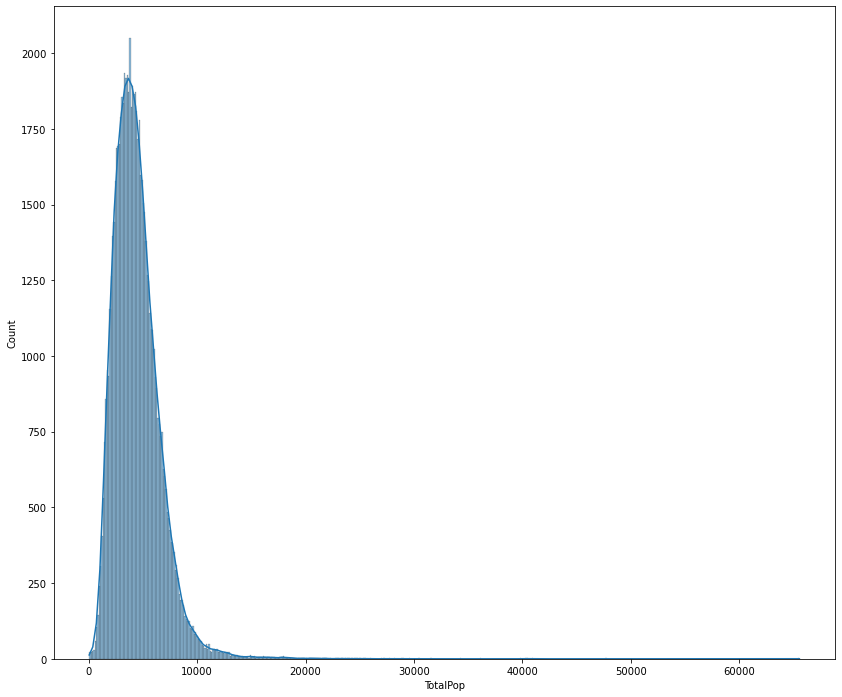

In [21]:
plt.figure(figsize=(14,12)) 

sns.histplot(x='TotalPop', data=df,kde=True);

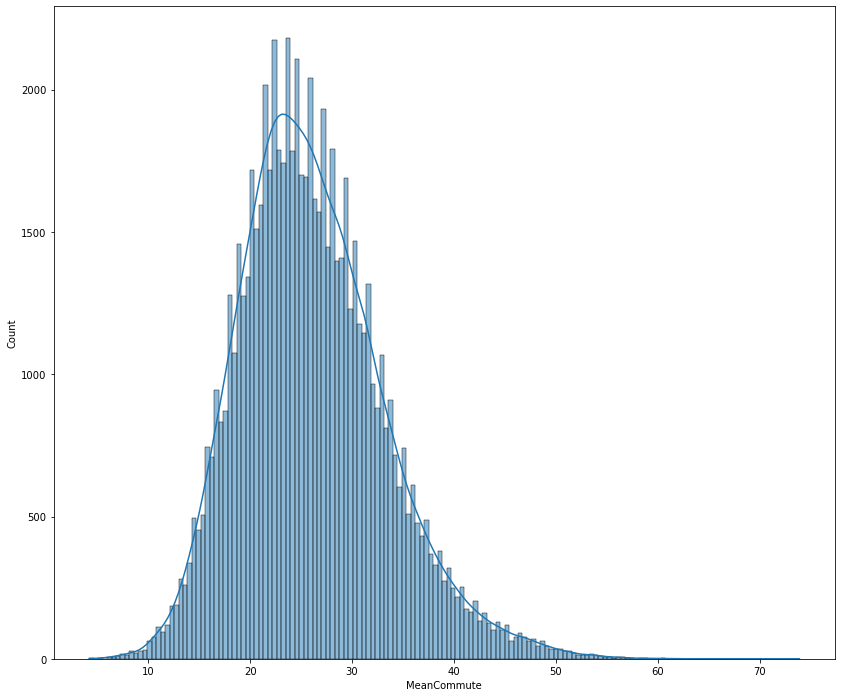

In [22]:
plt.figure(figsize=(14,12)) 

sns.histplot(x='MeanCommute', data=df,kde=True);

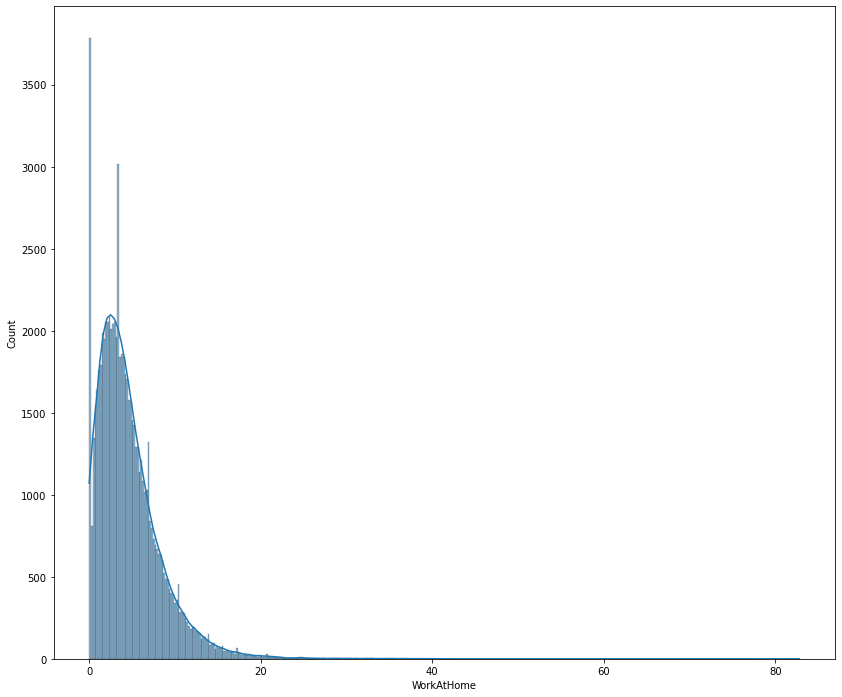

In [23]:
plt.figure(figsize=(14,12)) 

sns.histplot(x='WorkAtHome', data=df,kde=True);

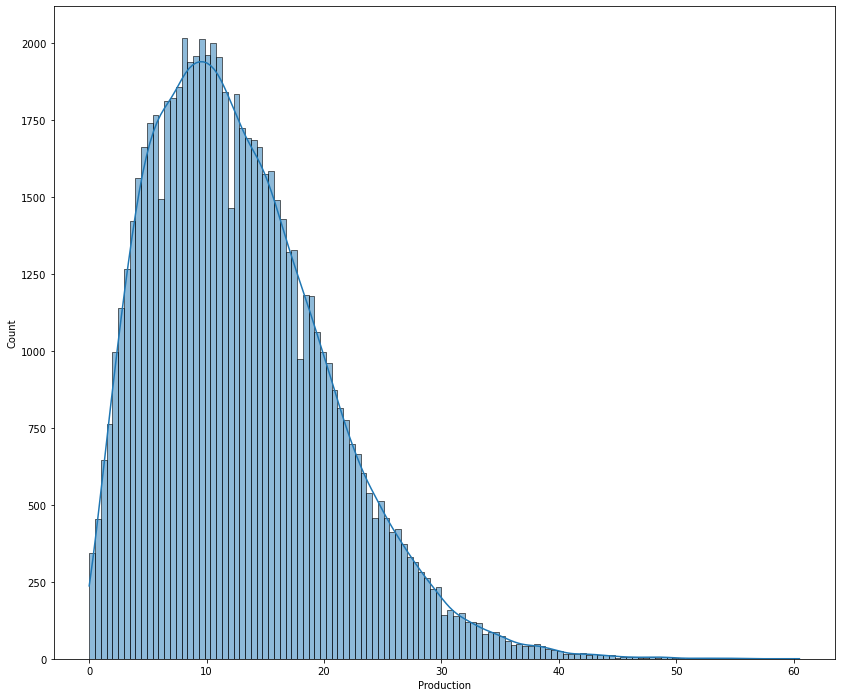

In [24]:
plt.figure(figsize=(14,12)) 

sns.histplot(x='Production', data=df,kde=True);

<AxesSubplot:xlabel='Women'>

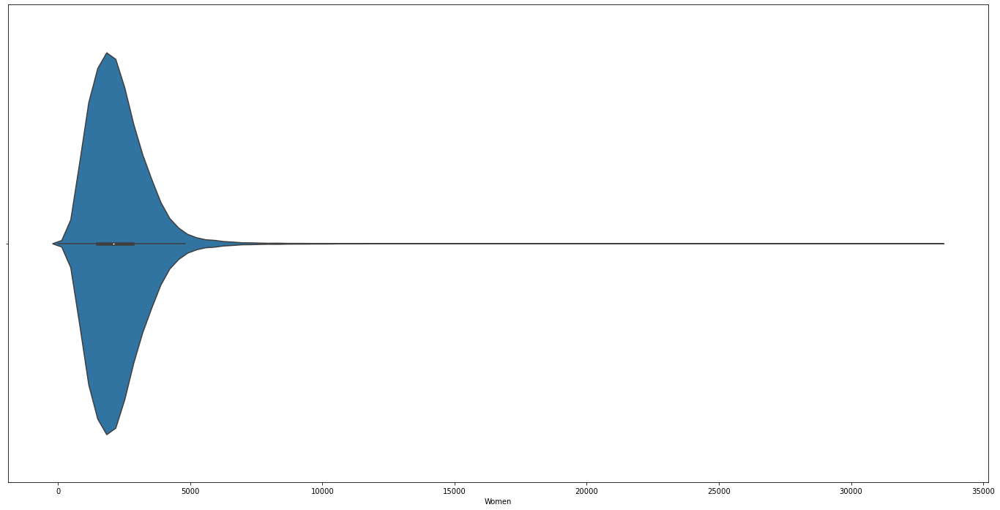

In [25]:
plt.figure(figsize=(24,12)) 
sns.violinplot(x ='Women', data = df)

# Visualisation (analyse bivarié)


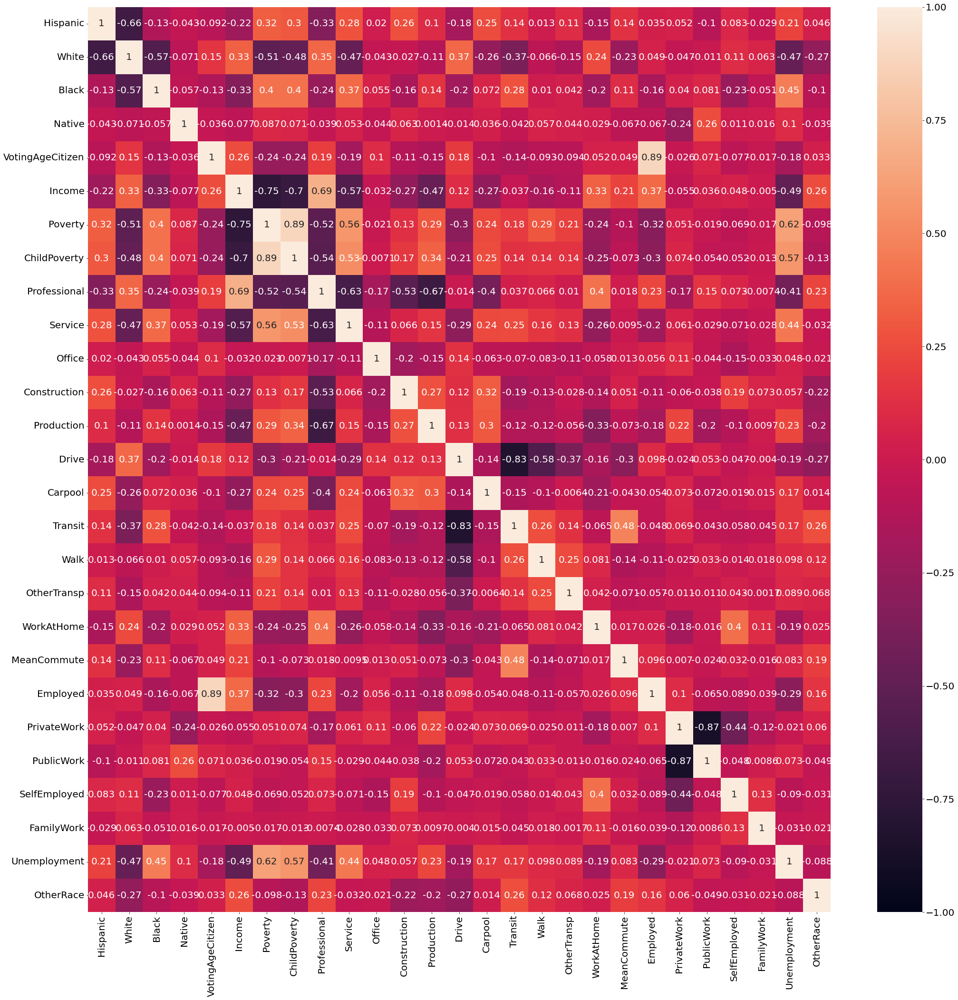

In [310]:
plt.figure(figsize=(35,35)) 

ax = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)
ax.figure.axes[-1].yaxis.label.set_size(40)
# plt.savefig("coeff.jpeg") #pour bien visualiser la matrice de corrélation
# plt.show()

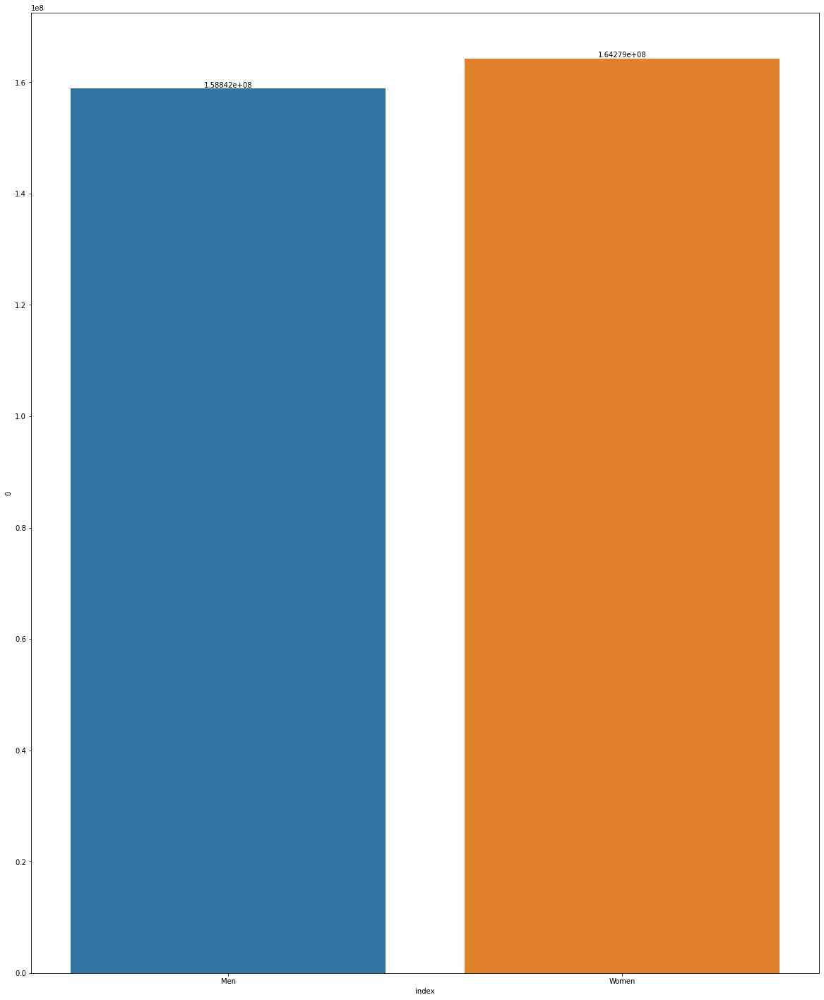

In [27]:
b7 = df.agg({'Men':'sum','Women':'sum'}) #le total de nombre des hommes et des femmes
b7 = pd.DataFrame(b7)
b7 = b7.reset_index(level=0)
plt.figure(figsize=(20,25))

v = sns.barplot(x= b7['index'] ,y= b7[b7.columns[1]] )
v.bar_label(v.containers[0])
plt.show()

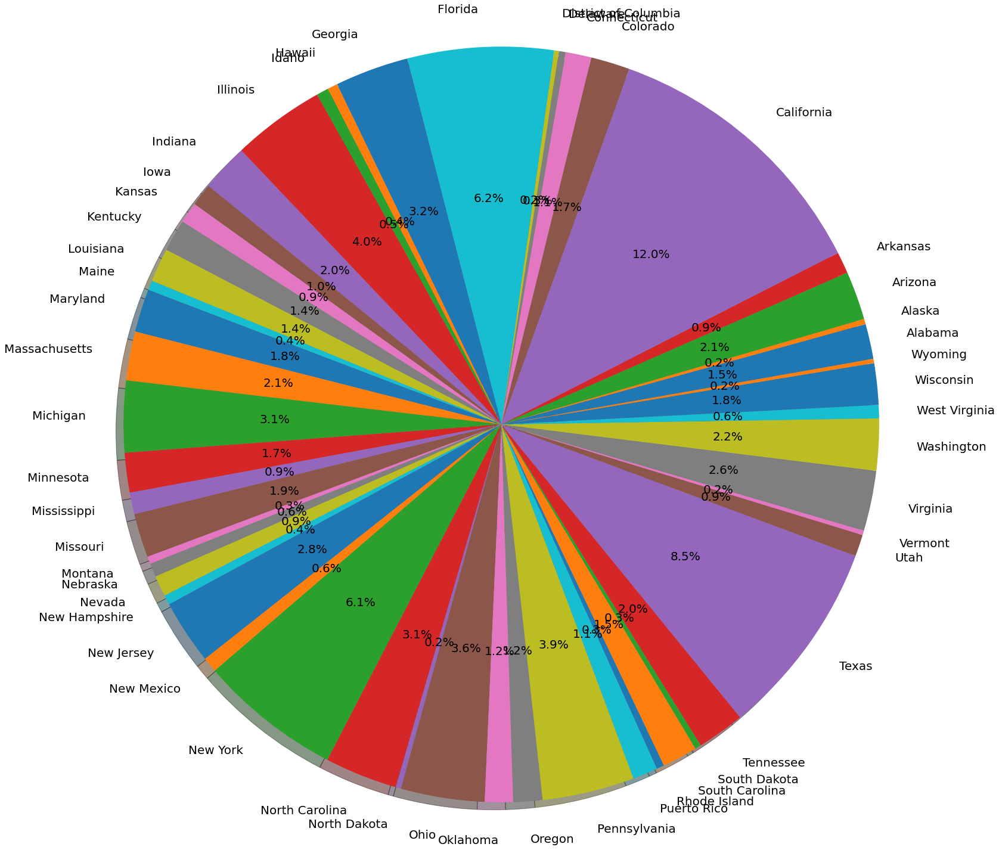

In [29]:
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue'] #le pourcentage de la population pour chaque état
explode = (0.1, 0, 0, 0)  

plt.rcParams['font.size'] = 20.0

plt.figure(figsize=(25,25))
plt.pie(a1['Total'], labels=a1['State'], 
autopct='%1.1f%%', shadow=True, startangle=10)

plt.axis('equal')
plt.show()

[Text(0.5, 0, 'pourcentage des races'),
 Text(0, 0.5, 'Etats'),
 Text(0.5, 1.0, 'Pourcentage de chaque race dans état')]

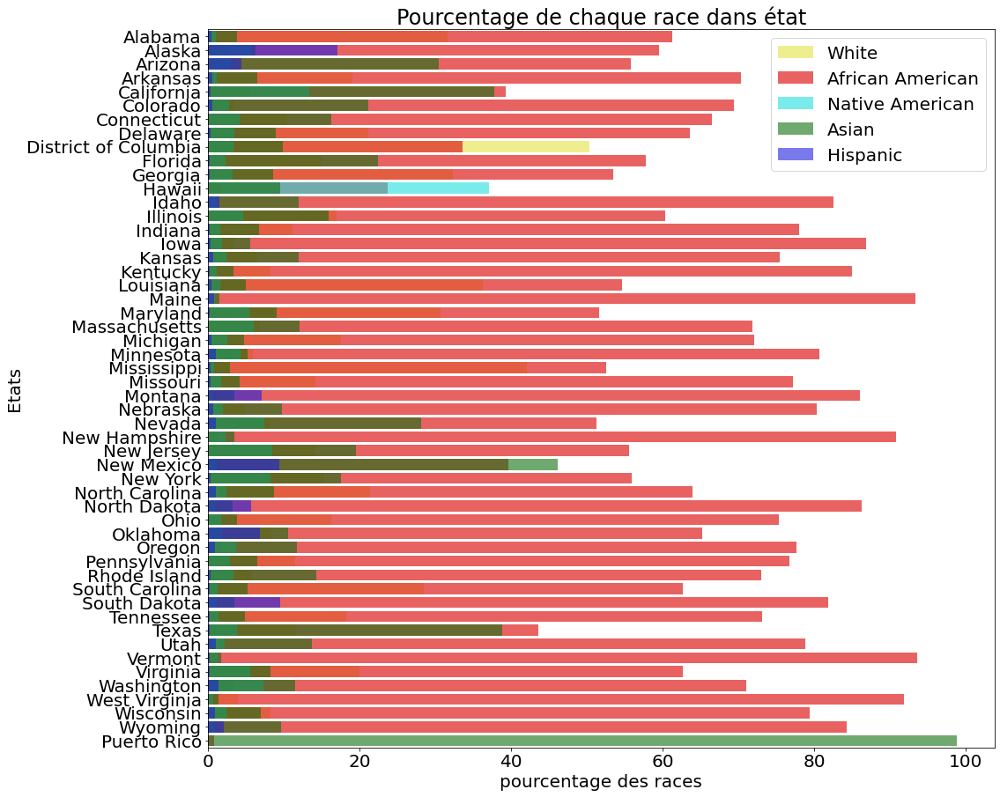

In [30]:
list_state = df['State'].unique()
white_total = [] #création des listes qui vont contenir la somme de nomre de chaque race
black_total = []
native_total = []
asian_total = []
hispanic_total = []
for a in list_state:
    x = df[df['State']==a]
    white_total.append(sum(x.White)/len(x))
    black_total.append(sum(x.Black) / len(x))
    native_total.append(sum(x.Native) / len(x))
    hispanic_total.append(sum(x.Asian) / len(x))
    asian_total.append(sum(x.Hispanic) / len(x))
figure,ax = plt.subplots(figsize = (16,15)) 
sns.barplot(x=black_total,y=list_state,color='yellow',alpha = 0.5,label='White' )
sns.barplot(x=white_total,y=list_state,color='red',alpha = 0.7,label='African American')
sns.barplot(x=hispanic_total,y=list_state,color='cyan',alpha = 0.6,label='Native American')
sns.barplot(x=asian_total,y=list_state,color='green',alpha = 0.6,label='Asian')
sns.barplot(x=native_total,y=list_state,color='blue',alpha = 0.6,label='Hispanic')    

ax.legend(loc='upper right',frameon = True) 
ax.set(xlabel='pourcentage des races', ylabel='Etats',title = "Pourcentage de chaque race dans état")

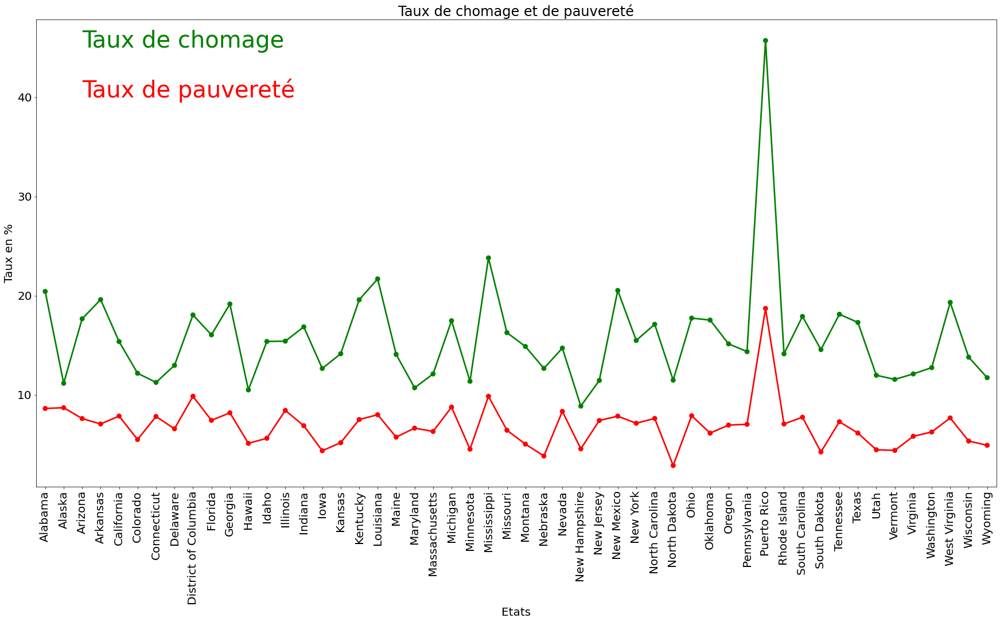

In [31]:
b1 = df.groupby('State')['Poverty'].mean().reset_index(name ='moyenne_de_pauvereté')
b2 = df.groupby('State')['Unemployment'].mean().reset_index(name ='moyenne_de_chomage')
figure,ax = plt.subplots(figsize =(30,15))
sns.pointplot(x='State',y='moyenne_de_pauvereté',data=b1,color='green',alpha=0.8)
sns.pointplot(x='State',y='moyenne_de_chomage',data=b2,color='red',alpha=0.8)

plt.setp(ax.get_xticklabels(), rotation=90)
plt.title('taux de chomage vs taux de pauvereté',fontsize = 40,color='black')
ax.set(ylabel='Taux en %', xlabel='Etats',title = "Taux de chomage et de pauvereté")

plt.text(2,45,'Taux de chomage',color='green',fontsize = 40)
plt.text(2,40,'Taux de pauvereté',color='red',fontsize = 40)


plt.show()

In [32]:
df2 = df.copy() 
dictionnaire  = { #pour travailler avec plotly map il faut les codes des états 
    'Alaska':'AK' ,
    'Alabama': 'AL',
    'Arkansas':'AR' ,
    'Arizona':'AZ',
    'California':'CA',
    'Colorado':'CO' ,
    'Connecticut':'CT' ,
    'District of Columbia':'DC' ,
    'Delaware':'DE' ,
    'Florida':'FL' ,
    'Georgia':'GA' ,
    'Hawaii':'HI' ,
     'Iowa':'IA',
     'Idaho':'ID',
     'Illinois':'IL',
     'Indiana':'IN',
     'Kansas':'KS',
     'Kentucky':'KY',
     'Louisiana':'LA',
     'Massachusetts':'MA',
     'Maryland':'MD',
     'Maine':'ME',
     'Michigan':'MI',
     'Minnesota':'MN',
     'Missouri':'MO',
     'Mississippi':'MS',
     'Montana':'MT',
     'North Carolina':'NC',
     'North Dakota':'ND',
     'Nebraska':'NE',
     'New Hampshire':'NH',
     'New Jersey':'NJ',
     'New Mexico':'NM',
     'Nevada':'NV',
     'New York':'NY',
     'Ohio':'OH',
     'Oklahoma':'OK',
     'Oregon':'OR',
     'Pennsylvania':'PA',
     'Rhode Island':'RI',
    'South Carolina':'SC' ,
     'South Dakota':'SD',
     'Tennessee':'TN',
     'Texas':'TX',
     'Utah':'UT',
    'Virginia':'VA' ,
     'Vermont':'VT',
     'Washington':'WA',
     'Wisconsin':'WI',
     'West Virginia':'WV',
     'Wyoming':'WY'
}
df2['state-code'] = df2['State'].map(dictionnaire) #faire un mapping entre les états et leurs codes


In [33]:
b3 = df2.groupby(['state-code'])['VotingAgeCitizen'].sum().reset_index(name ='Total') #"le total des gens ayant le droit de voter "
fig = go.Figure(data = go.Choropleth(
    locations = b3['state-code'],
    z = b3['Total'],
    locationmode = "USA-states",
    colorscale = "Reds",
    colorbar_title = "VotingAgeCitizen"))

fig.update_layout(
    title_text = "Nombre des gens ayant le droit de voter",
    geo_scope = "usa")

fig.show()

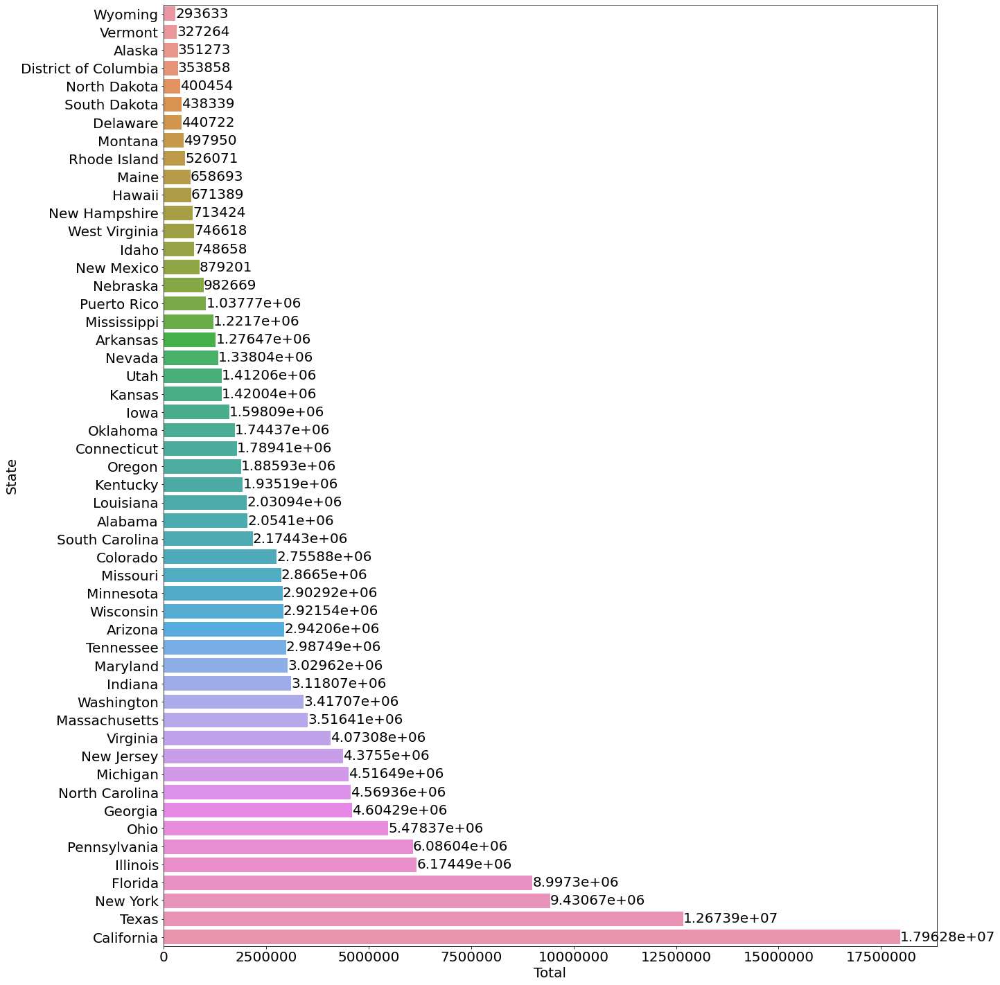

In [34]:
b4 = df2.groupby(['State'])['Employed'].sum().reset_index(name ='Total') #le nombre total des gens qui travaillent dans chaque état
plt.figure(figsize=(20,25))


v = sns.barplot(y ="State",x="Total",data = b4, order=b4.sort_values('Total').State)
v.bar_label(v.containers[0])
v.xaxis.set_major_formatter('{x:1.0f}')

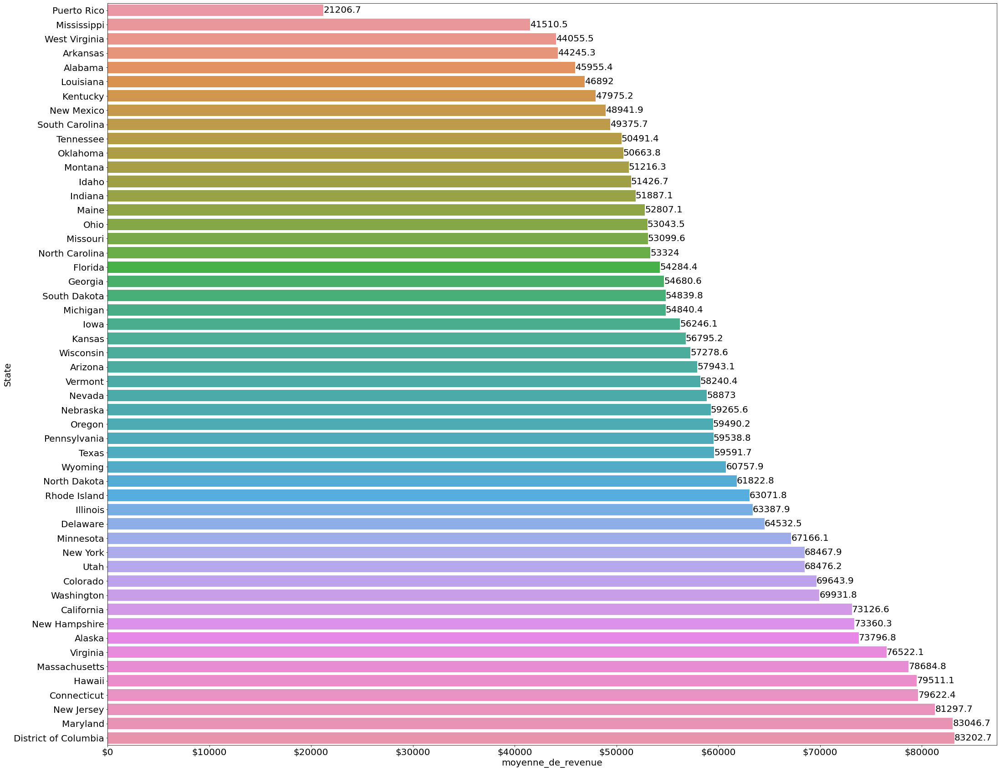

In [35]:
b5=  df2.groupby('State')['Income'].mean().reset_index(name ='moyenne_de_revenue') #moyenne de revenue dans chaque état


plt.figure(figsize=(35,30))

v = sns.barplot(x='moyenne_de_revenue', y='State', data=b5 , order=b5.sort_values('moyenne_de_revenue').State)
v.bar_label(v.containers[0])
v.xaxis.set_major_formatter('${x:1.0f}')


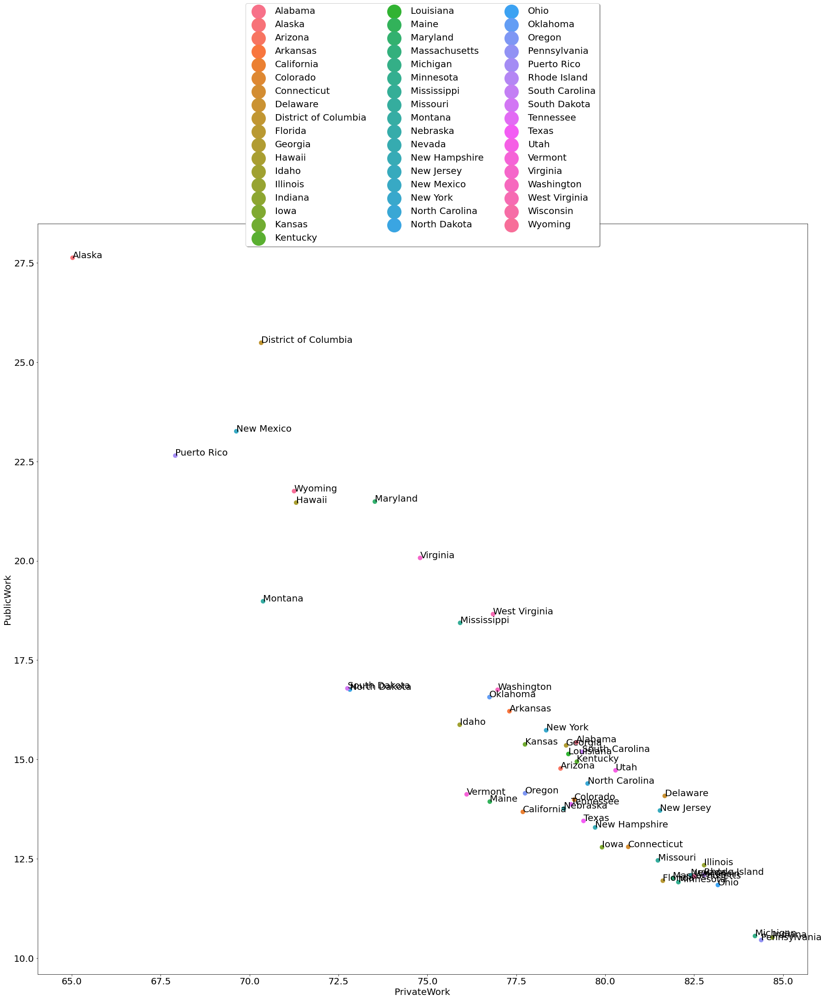

In [36]:
b6 = df2.groupby('State')['PrivateWork','PublicWork'].mean() #moyenne de gens qui travailllent dans le secteur privé et public pour chaque état
b6.reset_index(inplace=True)
plt.figure(figsize=(30,30))

ax = sns.scatterplot(x='PrivateWork', y='PublicWork', data=b6, hue='State',s=100,linewidth=0)
# plt.setp(ax.get_legend().get_texts(), fontsize='50') 

b6[['PrivateWork','PublicWork','State']].apply(lambda row: ax.text(*row),axis=1);

plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),markerscale=5,
          ncol=3, fancybox=True, shadow=True)

# plt.show()

In [311]:
b8 = df2.groupby(['state-code'])['ChildPoverty'].mean().reset_index(name ='Moyenne') #moyenne de pauvreté dans chaque état
fig = go.Figure(data = go.Choropleth(
    locations = b8['state-code'],
    z = b8['Moyenne'],
    locationmode = "USA-states",
    colorscale = "Viridis",
    colorbar_title = "Pourcentage de la pauvererté des enfants "))

fig.update_layout(
    title_text = "Pourcentage de la pauvererté des enfants pour chaque état",
    geo_scope = "usa")

fig.show()

<AxesSubplot:xlabel='Poverty', ylabel='Income'>

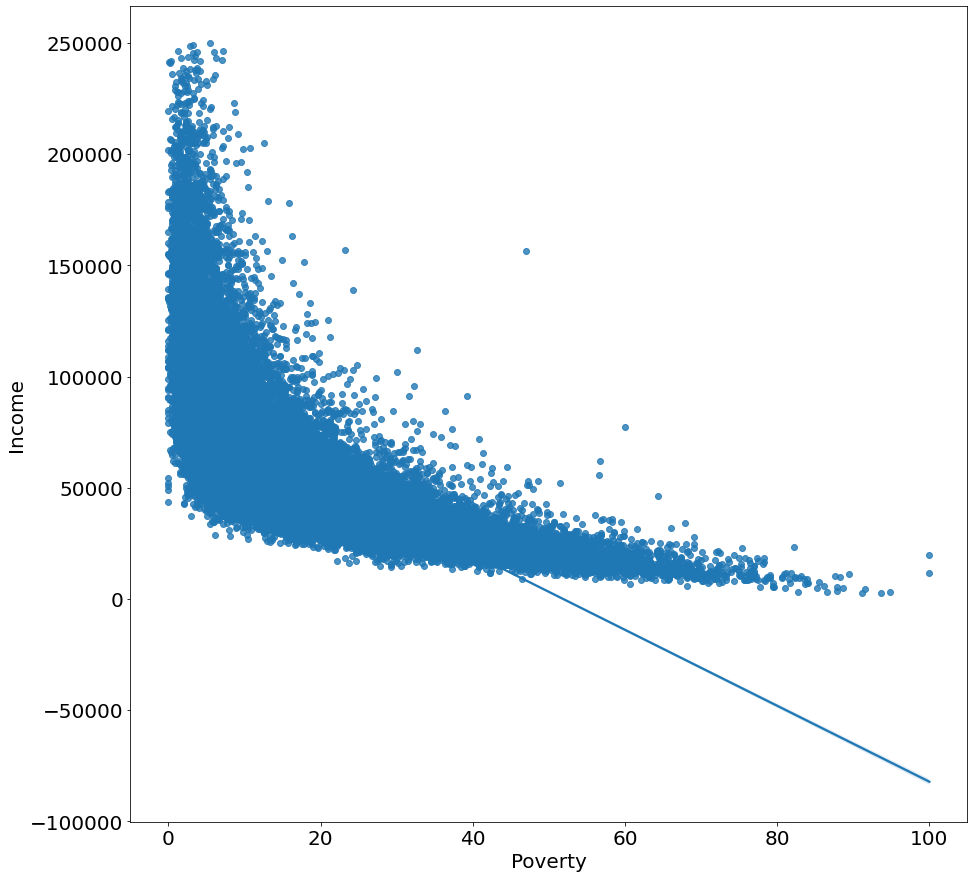

In [38]:
plt.figure(figsize=(15,15)) #relation entre le revenue et la pauvreté

sns.regplot(x='Poverty', y="Income", data=df)

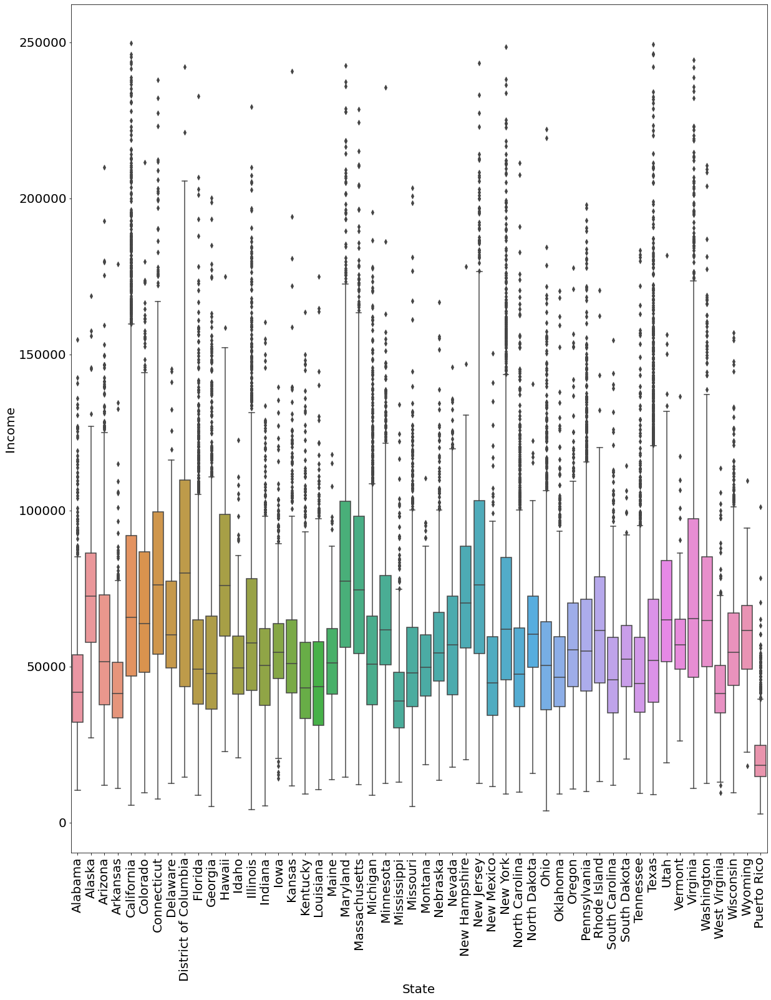

In [39]:
plt.figure(figsize=(20,25)) #boite à moustache des revenues de chaque état

g = sns.boxplot(x="State", y="Income", data=df) 

plt.setp(g.get_xticklabels(), rotation=90)

plt.show()

# Transformation et suppression des valeurs aberrantes

In [40]:
df = df.drop(['TractId','State','County','TotalPop','IncomeErr','IncomePerCap','IncomePerCapErr'], axis=1) #opinion d'experts , ces colonnes ne serviront pas à faire ni la prédiction , ni classification de n'importe quel attribut

In [41]:
def delete_outliers(df,column):#fonction pour supprimer les valeurs aberrantes
#  df.reindex()
 df.reset_index(drop=True, inplace=True)
 q1 = np.percentile(df[column], 25,interpolation = 'midpoint')
 q3 = np.percentile(df[column], 75,interpolation = 'midpoint')
 iqr = q3 - q1
 print("Dimension du dataframe avant la suppression des valeurs aberrantes de la colonne:",column,"est"  ,df.shape) #dimension avant la suppression des valeurs abberantes
 
 upper = np.where(df[column] >= (q3+1.5*iqr))
 lower = np.where(df[column] <= (q1-1.5*iqr))
 

 df.drop(upper[0], inplace = True)
 df.drop(lower[0], inplace = True)
#  condition = ~((df[column] < (q1 - 1.5 * iqr)) | df[column] > (q3 + 1.5 * iqr)).any(axis=1)

# # Filter our dataframe based on condition
#  df = df[condition]
  
 print("Dimension du dataframe apres la suppression des valeurs aberrantes de la colonne:",column,"est"  ,df.shape) #dimension apres la suppression des valeurs abberantes

In [42]:
#suppression des outliers 
delete_outliers(df,'Income') 


Dimension du dataframe avant la suppression des valeurs aberrantes de la colonne: Income est (72718, 30)
Dimension du dataframe apres la suppression des valeurs aberrantes de la colonne: Income est (69834, 30)


In [43]:
df['OtherRace'] = df['Asian'] + df['Pacific'] #création d'une nouvelle colonne
df = df.drop(['Asian','Pacific','Men','Women'], axis=1) #suppression de ces deux colonnes

In [45]:
X = df.drop('Income',axis=1) #dataframe qui contient les variables explicatives 
y = df['Income'] #variable de réponse

In [46]:
chi2_scores = chi2(X,y) #utilisation de la fonction chi2 pour savoir les attributs qui vont nous servir dans la prédiction du revenu


In [47]:
chi2_scores #scores

(array([1.29457651e+06, 6.91974803e+05, 1.61572292e+06, 9.77043375e+05,
        3.38698390e+07, 5.86329842e+05, 9.09132314e+05, 3.08302754e+05,
        1.58040305e+05, 5.19619817e+04, 1.50237387e+05, 1.91789299e+05,
        1.17445219e+05, 1.16729069e+05, 1.00671938e+06, 3.84089741e+05,
        1.27581211e+05, 1.23530842e+05, 7.72351255e+04, 2.95922182e+07,
        3.10543380e+04, 1.40525771e+05, 8.96481445e+04, 4.48440186e+04,
        1.88103689e+05, 7.09207432e+05]),
 array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 4.12549572e-80,
        0.00000000e+00, 0.00000000e+00]))

In [48]:
p_values = pd.Series(chi2_scores[1],index = X.columns) #on trie les valeurs de ces scores 
p_values.sort_values(ascending = False , inplace = True)
p_values

PrivateWork         1.000000e+00
FamilyWork          4.125496e-80
Hispanic            0.000000e+00
White               0.000000e+00
Unemployment        0.000000e+00
SelfEmployed        0.000000e+00
PublicWork          0.000000e+00
Employed            0.000000e+00
MeanCommute         0.000000e+00
WorkAtHome          0.000000e+00
OtherTransp         0.000000e+00
Walk                0.000000e+00
Transit             0.000000e+00
Carpool             0.000000e+00
Drive               0.000000e+00
Production          0.000000e+00
Construction        0.000000e+00
Office              0.000000e+00
Service             0.000000e+00
Professional        0.000000e+00
ChildPoverty        0.000000e+00
Poverty             0.000000e+00
VotingAgeCitizen    0.000000e+00
Native              0.000000e+00
Black               0.000000e+00
OtherRace           0.000000e+00
dtype: float64

<AxesSubplot:>

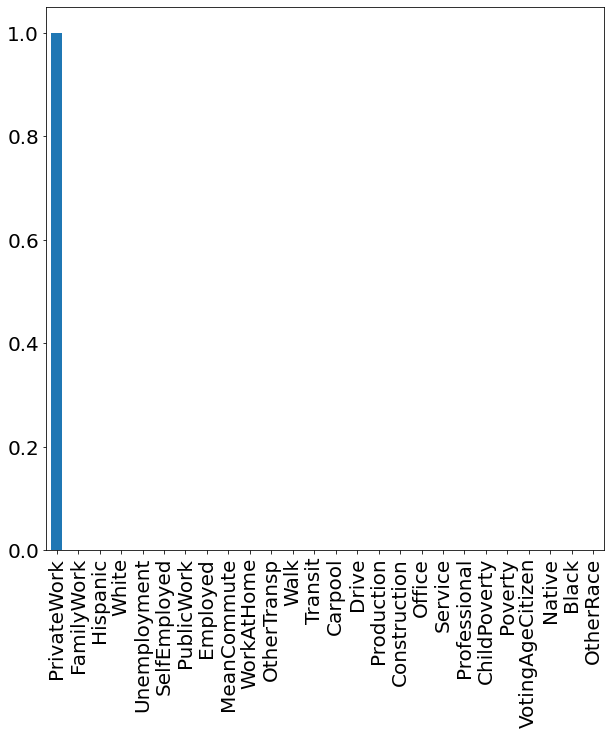

In [300]:
plt.figure(figsize=(10,10))
p_values.plot.bar() #visualisation des scores dans un barplot


In [50]:
X = X.drop(['FamilyWork','PrivateWork'],axis=1) #suppression des colonnes unitiles

# Prédiction du revenu de ménage avec la régression linéaire (sans normalisation)

## Vérification des conditions de la régression linéaire multiple

## Linéarité

<Figure size 1440x1800 with 0 Axes>

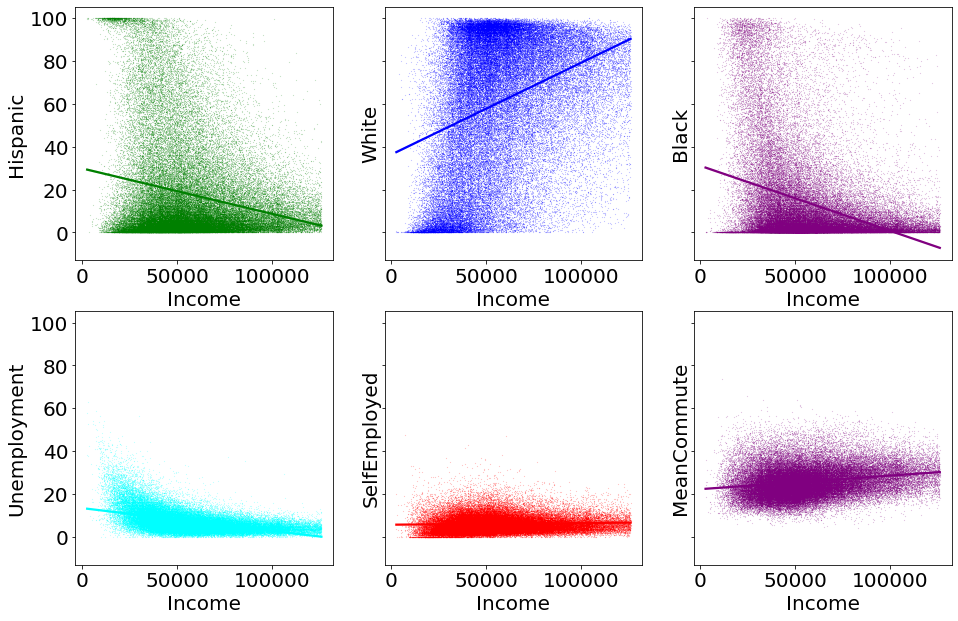

In [51]:
plt.figure(figsize=(20,25))
a4_dims = (15.7, 10.27)

fig, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(nrows=2,ncols=3, sharey=True,figsize=a4_dims)
sns.regplot(x=y, y=X['Hispanic'], color="g", scatter_kws={'s':0.01}, ax=ax1)
sns.regplot(x=y, y=X['White'], color="b",scatter_kws={'s':0.01}, ax=ax2)
sns.regplot(x=y, y=X['Black'], color="purple",scatter_kws={'s':0.01}, ax=ax3)
sns.regplot(x=y, y=X['Unemployment'], color="cyan",scatter_kws={'s':0.01}, ax=ax4)
sns.regplot(x=y, y=X['SelfEmployed'], color="red",scatter_kws={'s':0.01}, ax=ax5)
sns.regplot(x=y, y=X['MeanCommute'], color="purple",scatter_kws={'s':0.01}, ax=ax6)

plt.show()

<Figure size 1440x1800 with 0 Axes>

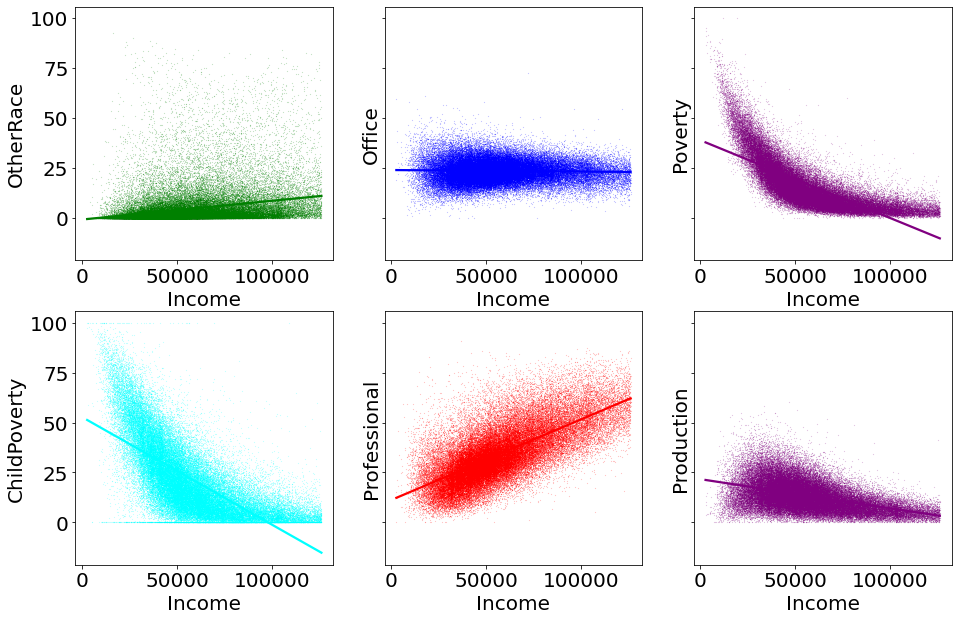

In [52]:
plt.figure(figsize=(20,25))
a4_dims = (15.7, 10.27)

fig, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(nrows=2,ncols=3, sharey=True,figsize=a4_dims)
sns.regplot(x=y, y=X['OtherRace'], color="g", scatter_kws={'s':0.01}, ax=ax1)
sns.regplot(x=y, y=X['Office'], color="b", scatter_kws={'s':0.01} ,ax=ax2)
sns.regplot(x=y, y=X['Poverty'], color="purple", scatter_kws={'s':0.01}, ax=ax3)
sns.regplot(x=y, y=X['ChildPoverty'], color="cyan", scatter_kws={'s':0.01}, ax=ax4)
sns.regplot(x=y, y=X['Professional'], color="red", scatter_kws={'s':0.01}, ax=ax5)
sns.regplot(x=y, y=X['Production'], color="purple", scatter_kws={'s':0.01}, ax=ax6)

plt.show()

<Figure size 1440x1800 with 0 Axes>

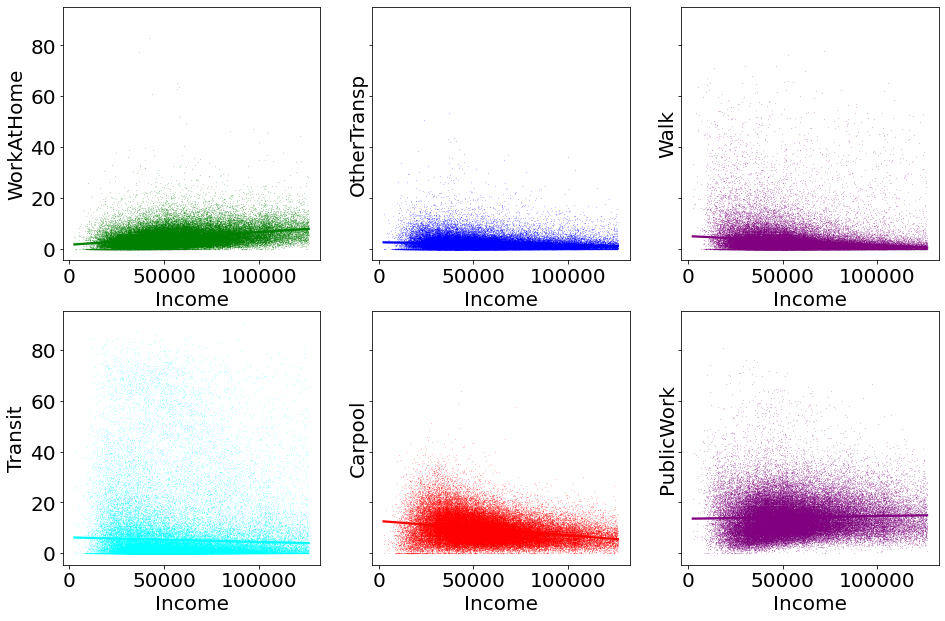

In [53]:
plt.figure(figsize=(20,25))
a4_dims = (15.7, 10.27)

fig, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(nrows=2,ncols=3, sharey=True,figsize=a4_dims)
sns.regplot(x=y, y=X['WorkAtHome'], color="g", scatter_kws={'s':0.01}, ax=ax1)
sns.regplot(x=y, y=X['OtherTransp'], color="b", scatter_kws={'s':0.01} ,ax=ax2)
sns.regplot(x=y, y=X['Walk'], color="purple", scatter_kws={'s':0.01}, ax=ax3)
sns.regplot(x=y, y=X['Transit'], color="cyan", scatter_kws={'s':0.01}, ax=ax4)
sns.regplot(x=y, y=X['Carpool'], color="red", scatter_kws={'s':0.01}, ax=ax5)
sns.regplot(x=y, y=X['PublicWork'], color="purple", scatter_kws={'s':0.01}, ax=ax6)

plt.show()

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30) #division des données en données de test et d'entrainement

In [55]:
X_train = sm.add_constant(X_train) #ajout de la constante
X_test = sm.add_constant(X_test)

In [56]:
#Fit the model
model = sm.OLS(y_train,X_train).fit() #entrainer le modéle
y_pred = model.predict(X_test)

In [57]:
residu = y_test-y_pred #calculer le residu
residu

55982   -11071.990360
38757   -13729.631046
24997    -7284.608596
63636     7742.706373
14536    -3271.505847
             ...     
57311     3083.021778
7202     -4409.962447
593      36288.594010
26624    21405.871862
20915   -13083.190372
Length: 13967, dtype: float64

## Résidus presque normaux

<AxesSubplot:ylabel='Count'>

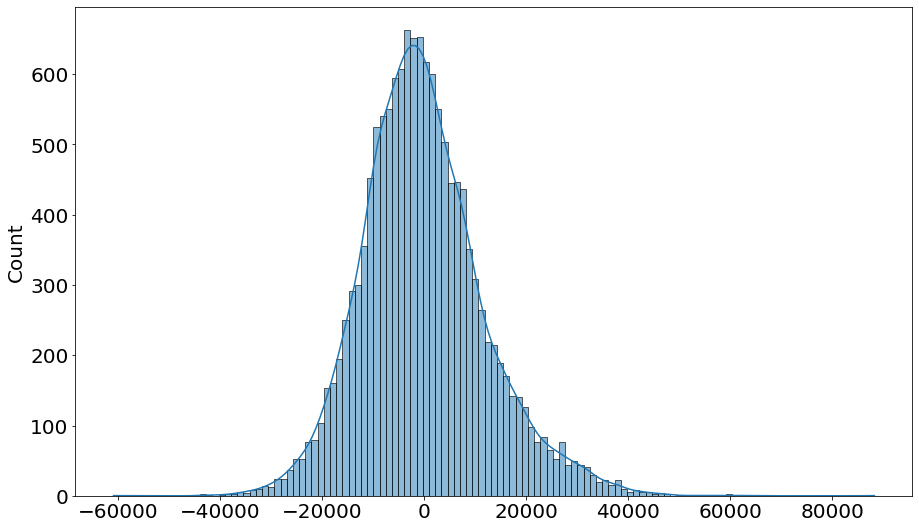

In [58]:
plt.figure(figsize=(15,9))
sns.histplot(data = residu, kde=True)

## Variabilité constante des résidus


<AxesSubplot:>

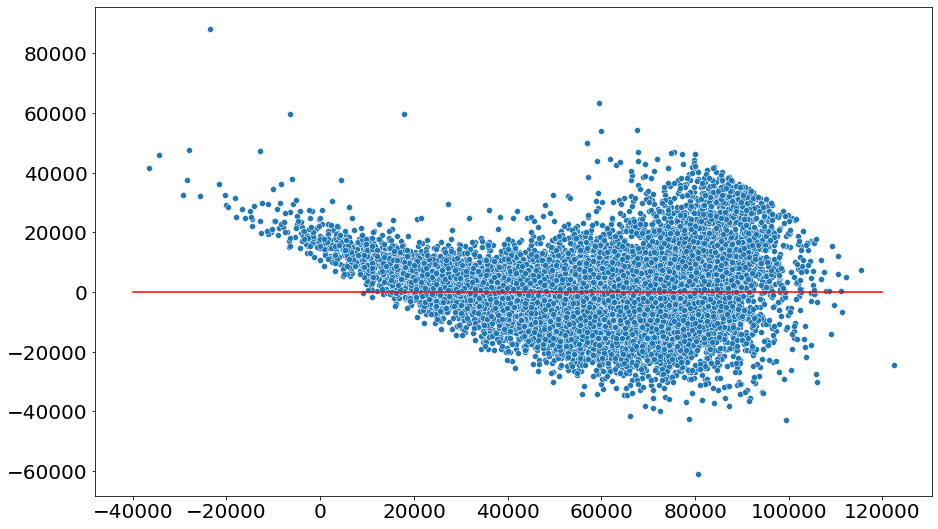

In [59]:
plt.figure(figsize=(15,9))
sns.scatterplot(y_pred,residu)
sns.lineplot([-40000,120000],[0,0],color='red')

## Indépendance des résidus


<AxesSubplot:>

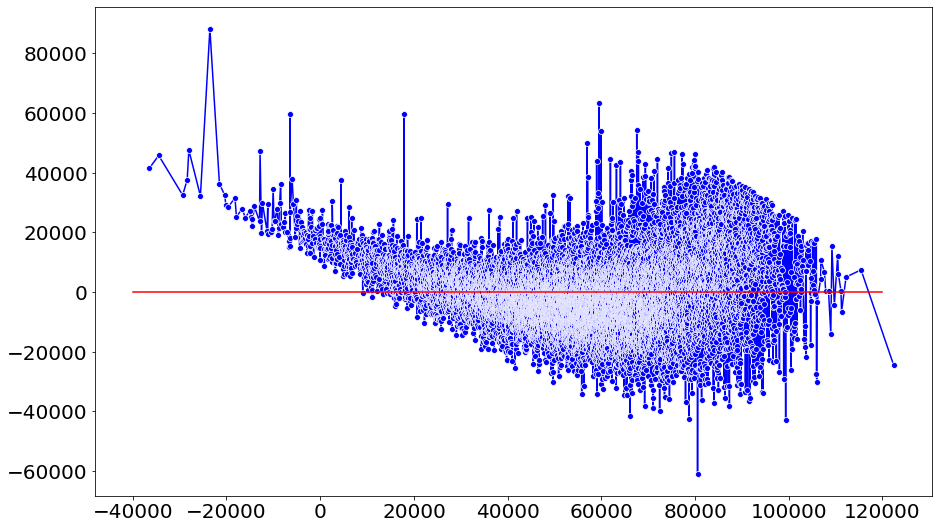

In [60]:
plt.figure(figsize=(15,9)) #on remarque que les valeurs sont indépendantes
sns.lineplot(y_pred,residu,marker='o',color='blue')
sns.lineplot([-40000,120000],[0,0],color='red')

## Metriques de la régression

In [223]:

m4 = np.log(np.sqrt(mean_squared_error(y_test,y_pred)))
print("Root Mean Squared Log Error(RMSLE)  est :",m4)


Root Mean Squared Log Error(RMSLE)  est : 9.393808748860678


In [63]:
print('beta_0: ', model.params[0])
print('beta_1: ', model.params[1])
model.summary()

beta_0:  24032.203364970243
beta_1:  -152.71249316159685


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Income   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.751
Method:                 Least Squares   F-statistic:                     7017.
Date:                Thu, 22 Dec 2022   Prob (F-statistic):               0.00
Time:                        17:00:56   Log-Likelihood:            -6.0405e+05
No. Observations:               55867   AIC:                         1.208e+06
Df Residuals:                   55842   BIC:                         1.208e+06
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             2.403e+04   1.09e+05      0.220      0.826    -1.9e+05    2.38e+05
Hispanic          -152.7125     20.810     -7.338      0.000    -193.500    -111.925
White             -183.9896     21.087     -8.725      0.000    -225.320    -142.659
Black             -219.1619     21.183    -10.346      0.000    -260.680    -177.644
Native            -210.0288     24.642     -8.523      0.000    -258.328    -161.730
VotingAgeCitizen    -3.2640      0.089    -36.491      0.000      -3.439      -3.089
Poverty           -970.5462     10.577    -91.762      0.000    -991.277    -949.816
ChildPoverty        50.9005      6.306      8.071      0.000      38.540      63.261
Professional      1168.3590    787.528      1.484      0.138    -375.201    2711.919
Service            462.2557    787.606      0.587      0.557   -1081.457    2005.968
Office             575.1074    787.550      0.730      0.465    -968.496    2118.711
Construction       538.7532    787.547      0.684      0.494   -1004.844    2082.350
Production         438.2902    787.565      0.557      0.578   -1105.343    1981.923
Drive             -241.8028    759.067     -0.319      0.750   -1729.580    1245.974
Carpool           -255.2484    759.087     -0.336      0.737   -1743.065    1232.568
Transit           -369.9879    759.112     -0.487      0.626   -1857.851    1117.876
Walk              -317.2168    759.152     -0.418      0.676   -1805.159    1170.726
OtherTransp       -314.3673    759.404     -0.414      0.679   -1802.805    1174.070
WorkAtHome         272.7552    759.142      0.359      0.719   -1215.169    1760.679
MeanCommute        517.8892      9.281     55.798      0.000     499.698     536.081
Employed             5.9269      0.126     46.930      0.000       5.679       6.174
PublicWork          14.0185      8.186      1.712      0.087      -2.027      30.063
SelfEmployed      -307.1199     15.572    -19.723      0.000    -337.641    -276.599
Unemployment       149.1434     14.092     10.584      0.000     121.524     176.763
OtherRace           -3.1804     23.577     -0.135      0.893     -49.391      43.030
==============================================================================
Omnibus:                     2969.819   Durbin-Watson:                   2.011
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4130.754
Skew:                           0.496   Prob(JB):                         0.00
Kurtosis:                       3.889   Cond. No.                     8.96e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.96e+06. This might indicate that there are
strong multicollinearity or other numerical probl

# Prédiction du revenu de ménage avec la régression linéaire (avec la normalisation)


In [64]:


scaler = MinMaxScaler() 

X1 = pd.DataFrame(scaler.fit_transform(X.values), columns=X.columns, index=X.index) #standarisation des variables explicatives

X1

,Hispanic,White,Black,Native,VotingAgeCitizen,Poverty,ChildPoverty,Professional,Service,Office,...,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PublicWork,SelfEmployed,Unemployment,OtherRace
0,0.024,0.863,0.052,0.000000,0.034740,0.107,0.208,0.423077,0.220028,0.315353,...,0.000000,0.006435,0.000000,0.025362,0.291248,0.033846,0.262701,0.094937,0.073248,0.012959
1,0.011,0.416,0.545,0.000000,0.040967,0.224,0.358,0.335165,0.351199,0.316736,...,0.000000,0.000000,0.009363,0.000000,0.258250,0.032706,0.185874,0.189873,0.054140,0.010799
2,0.080,0.614,0.265,0.006036,0.062009,0.147,0.211,0.306593,0.273625,0.460581,...,0.000000,0.012870,0.014981,0.018116,0.271162,0.057471,0.261462,0.101266,0.074841,0.011879
3,0.096,0.803,0.071,0.005030,0.081756,0.023,0.017,0.318681,0.234133,0.356846,...,0.000000,0.019305,0.054307,0.025362,0.311334,0.071897,0.244114,0.094937,0.097134,0.002160
4,0.009,0.775,0.164,0.000000,0.182698,0.122,0.179,0.536264,0.194640,0.283541,...,0.000000,0.010296,0.005618,0.008454,0.241033,0.187389,0.298637,0.094937,0.036624,0.033477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72713,0.997,0.003,0.000,0.000000,0.108999,0.394,0.618,0.463736,0.356841,0.248963,...,0.068282,0.006435,0.000000,0.043478,0.325681,0.061166,0.418835,0.147679,0.331210,0.000000
72714,0.991,0.009,0.000,0.000000,0.042593,0.355,0.399,0.378022,0.188999,0.319502,...,0.101322,0.000000,0.000000,0.015700,0.302726,0.025394,0.438662,0.130802,0.418790,0.000000
72715,0.995,0.002,0.000,0.000000,0.040052,0.528,0.772,0.321978,0.332863,0.455048,...,0.000000,0.043758,0.000000,0.041063,0.276901,0.021227,0.427509,0.168776,0.366242,0.002160
72716,1.000,0.000,0.000,0.000000,0.084017,0.501,0.580,0.327473,0.290550,0.398340,...,0.012115,0.000000,0.000000,0.000000,0.285509,0.040961,0.376704,0.040084,0.469745,0.000000


### Vérification des conditions de la régression linéaire multiple

### Linéarité

<Figure size 1440x1800 with 0 Axes>

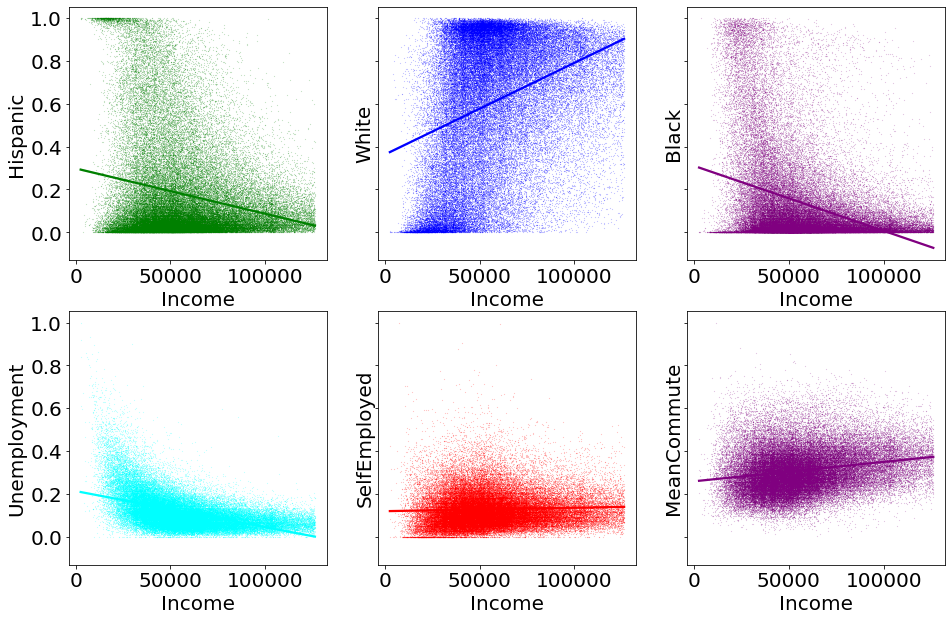

In [65]:
plt.figure(figsize=(20,25))
a4_dims = (15.7, 10.27)

fig, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(nrows=2,ncols=3, sharey=True,figsize=a4_dims)
sns.regplot(x=y, y=X1['Hispanic'], color="g", scatter_kws={'s':0.01}, ax=ax1)
sns.regplot(x=y, y=X1['White'], color="b",scatter_kws={'s':0.01}, ax=ax2)
sns.regplot(x=y, y=X1['Black'], color="purple",scatter_kws={'s':0.01}, ax=ax3)
sns.regplot(x=y, y=X1['Unemployment'], color="cyan",scatter_kws={'s':0.01}, ax=ax4)
sns.regplot(x=y, y=X1['SelfEmployed'], color="red",scatter_kws={'s':0.01}, ax=ax5)
sns.regplot(x=y, y=X1['MeanCommute'], color="purple",scatter_kws={'s':0.01}, ax=ax6)

plt.show()

<Figure size 1440x1800 with 0 Axes>

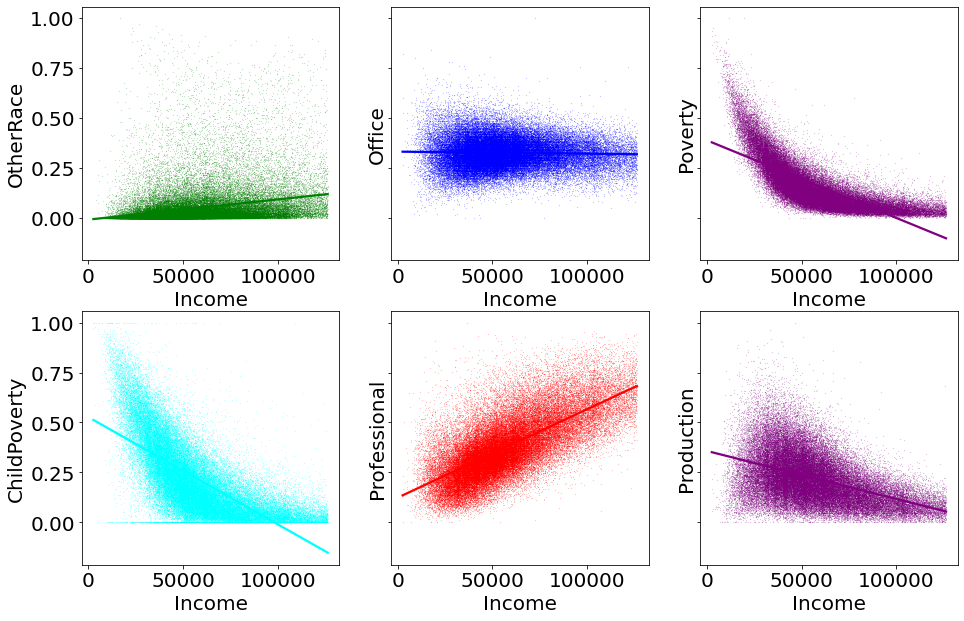

In [313]:
plt.figure(figsize=(20,25))
a4_dims = (15.7, 10.27)

fig, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(nrows=2,ncols=3, sharey=True,figsize=a4_dims)
sns.regplot(x=y, y=X1['OtherRace'], color="g", scatter_kws={'s':0.01}, ax=ax1)
sns.regplot(x=y, y=X1['Office'], color="b", scatter_kws={'s':0.01} ,ax=ax2)
sns.regplot(x=y, y=X1['Poverty'], color="purple", scatter_kws={'s':0.01}, ax=ax3)
sns.regplot(x=y, y=X1['ChildPoverty'], color="cyan", scatter_kws={'s':0.01}, ax=ax4)
sns.regplot(x=y, y=X1['Professional'], color="red", scatter_kws={'s':0.01}, ax=ax5)
sns.regplot(x=y, y=X1['Production'], color="purple", scatter_kws={'s':0.01}, ax=ax6)

plt.show()

<Figure size 1440x1800 with 0 Axes>

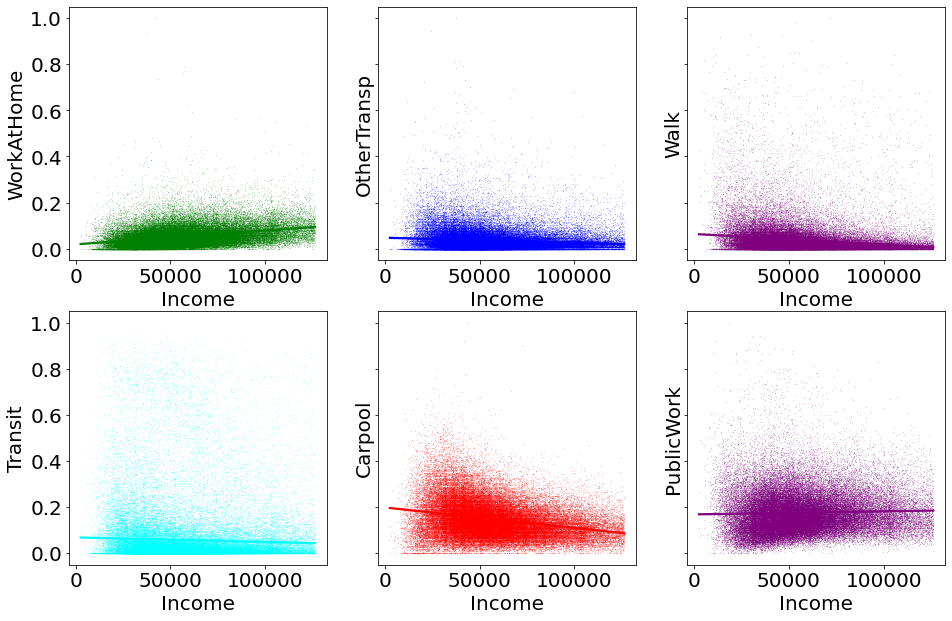

In [312]:
plt.figure(figsize=(20,25))
a4_dims = (15.7, 10.27)

fig, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(nrows=2,ncols=3, sharey=True,figsize=a4_dims)
sns.regplot(x=y, y=X1['WorkAtHome'], color="g", scatter_kws={'s':0.01}, ax=ax1)
sns.regplot(x=y, y=X1['OtherTransp'], color="b", scatter_kws={'s':0.01} ,ax=ax2)
sns.regplot(x=y, y=X1['Walk'], color="purple", scatter_kws={'s':0.01}, ax=ax3)
sns.regplot(x=y, y=X1['Transit'], color="cyan", scatter_kws={'s':0.01}, ax=ax4)
sns.regplot(x=y, y=X1['Carpool'], color="red", scatter_kws={'s':0.01}, ax=ax5)
sns.regplot(x=y, y=X1['PublicWork'], color="purple", scatter_kws={'s':0.01}, ax=ax6)

plt.show()

In [180]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y, test_size=0.2, random_state=30) #division des données en données de test et d'entrainement
X_train1 = sm.add_constant(X_train1)
X_test1 = sm.add_constant(X_test1)

In [181]:
model1 = sm.OLS(y_train1,X_train1).fit() #entrainer le modele
y_pred1 = model1.predict(X_test1)

In [182]:
residu1 = y_test1-y_pred1 #calculer le residu
residu1

55982   -11071.990360
38757   -13729.631046
24997    -7284.608596
63636     7742.706373
14536    -3271.505847
             ...     
57311     3083.021778
7202     -4409.962447
593      36288.594010
26624    21405.871862
20915   -13083.190372
Length: 13967, dtype: float64

### Résidus presque normaux

<AxesSubplot:ylabel='Count'>

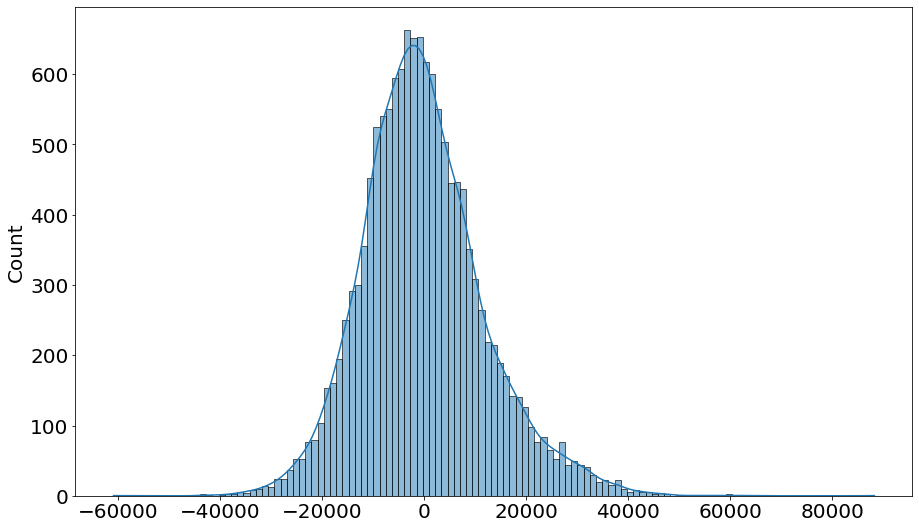

In [183]:
plt.figure(figsize=(15,9))
sns.histplot(data = residu1, kde=True)

### Variabilité constante des résidus


<AxesSubplot:>

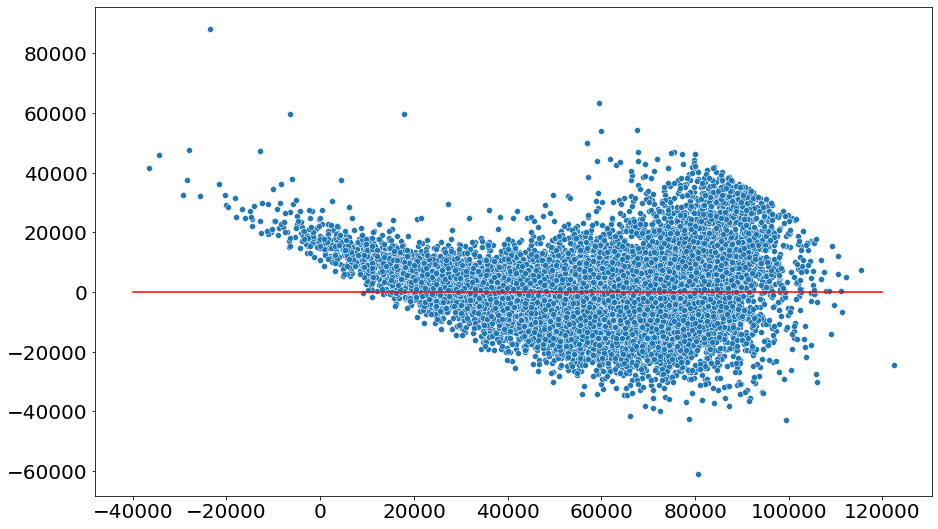

In [184]:
plt.figure(figsize=(15,9))
sns.scatterplot(y_pred1,residu1)
sns.lineplot([-40000,120000],[0,0],color='red')

### Indépendance des résidus

<AxesSubplot:>

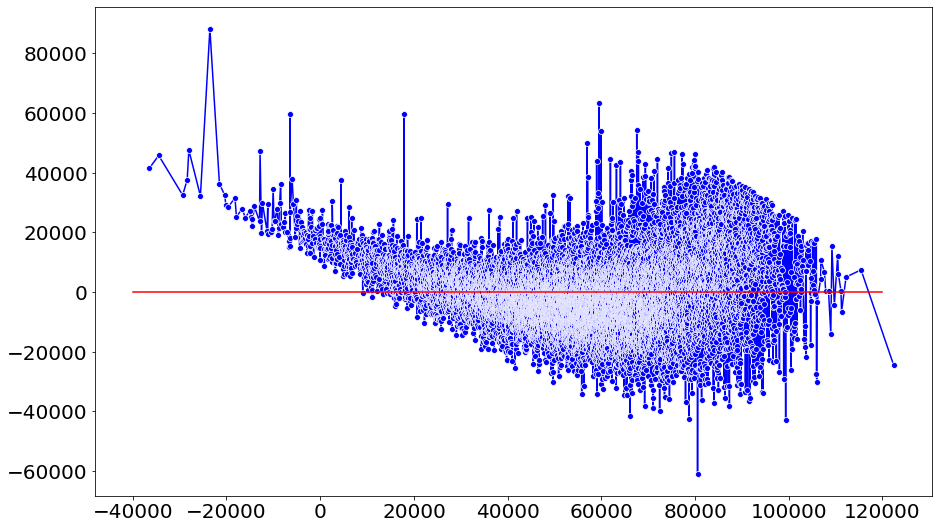

In [185]:
plt.figure(figsize=(15,9))
sns.lineplot(y_pred1,residu1,marker='o',color='blue')
sns.lineplot([-40000,120000],[0,0],color='red')

# Metriques de la régression

In [222]:

a4 = np.log(np.sqrt(mean_squared_error(y_test1,y_pred1)))
print("Root Mean Squared Log Error(RMSLE)  est :",a4)


Root Mean Squared Log Error(RMSLE)  est : 9.39380874886068


In [188]:
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Income   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.751
Method:                 Least Squares   F-statistic:                     7017.
Date:                Thu, 22 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:08:22   Log-Likelihood:            -6.0405e+05
No. Observations:               55867   AIC:                         1.208e+06
Df Residuals:                   55842   BIC:                         1.208e+06
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const              2.62e+04   1.09e+05      0.240      0.810   -1.87e+05     2.4e+05
Hispanic         -1.527e+04   2080.995     -7.338      0.000   -1.94e+04   -1.12e+04
White             -1.84e+04   2108.677     -8.725      0.000   -2.25e+04   -1.43e+04
Black            -2.192e+04   2118.252    -10.346      0.000   -2.61e+04   -1.78e+04
Native           -2.088e+04   2449.449     -8.523      0.000   -2.57e+04   -1.61e+04
VotingAgeCitizen -1.284e+05   3519.602    -36.491      0.000   -1.35e+05   -1.22e+05
Poverty          -9.705e+04   1057.673    -91.762      0.000   -9.91e+04    -9.5e+04
ChildPoverty      5090.0478    630.626      8.071      0.000    3854.016    6326.080
Professional      1.063e+05   7.17e+04      1.484      0.138   -3.41e+04    2.47e+05
Service           3.277e+04   5.58e+04      0.587      0.557   -7.67e+04    1.42e+05
Office            4.158e+04   5.69e+04      0.730      0.465      -7e+04    1.53e+05
Construction      3.669e+04   5.36e+04      0.684      0.494   -6.84e+04    1.42e+05
Production        2.652e+04   4.76e+04      0.557      0.578   -6.69e+04     1.2e+05
Drive            -2.418e+04   7.59e+04     -0.319      0.750   -1.73e+05    1.25e+05
Carpool          -1.634e+04   4.86e+04     -0.336      0.737   -1.12e+05    7.89e+04
Transit          -3.359e+04   6.89e+04     -0.487      0.626   -1.69e+05    1.02e+05
Walk             -2.465e+04    5.9e+04     -0.418      0.676    -1.4e+05     9.1e+04
OtherTransp      -1.679e+04   4.06e+04     -0.414      0.679   -9.63e+04    6.27e+04
WorkAtHome        2.258e+04   6.29e+04      0.359      0.719   -1.01e+05    1.46e+05
MeanCommute        3.61e+04    646.917     55.798      0.000    3.48e+04    3.74e+04
Employed          1.508e+05   3212.756     46.930      0.000    1.44e+05    1.57e+05
PublicWork        1131.2912    660.626      1.712      0.087    -163.540    2426.122
SelfEmployed     -1.456e+04    738.105    -19.723      0.000    -1.6e+04   -1.31e+04
Unemployment      9366.2085    884.948     10.584      0.000    7631.705    1.11e+04
OtherRace         -294.5091   2183.203     -0.135      0.893   -4573.602    3984.584
==============================================================================
Omnibus:                     2969.819   Durbin-Watson:                   2.011
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4130.754
Skew:                           0.496   Prob(JB):                         0.00
Kurtosis:                       3.889   Cond. No.                     5.72e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.72e+03. This might indicate that there are
strong multicollinearity or other numerical probl

# Prédiction du revenu du ménage avec la régression linéaire et le reduction de dimensionalité PCA

In [316]:
pca = PCA(n_components = 12) #on va garder juste la moitié des attributs de 24 à 12
reduced_data = pca.fit(X,y).transform(X)


In [317]:
reduced_dataframe = pd.DataFrame(reduced_data, columns = ['0','1','2','3','4','5','6','7','8','9','10','11'])
reduced_dataframe['Income'] = y.tolist()


Text(0.5, 1.0, 'Correlation entre les nouveaux colonnes avec la variable de réponse Income')

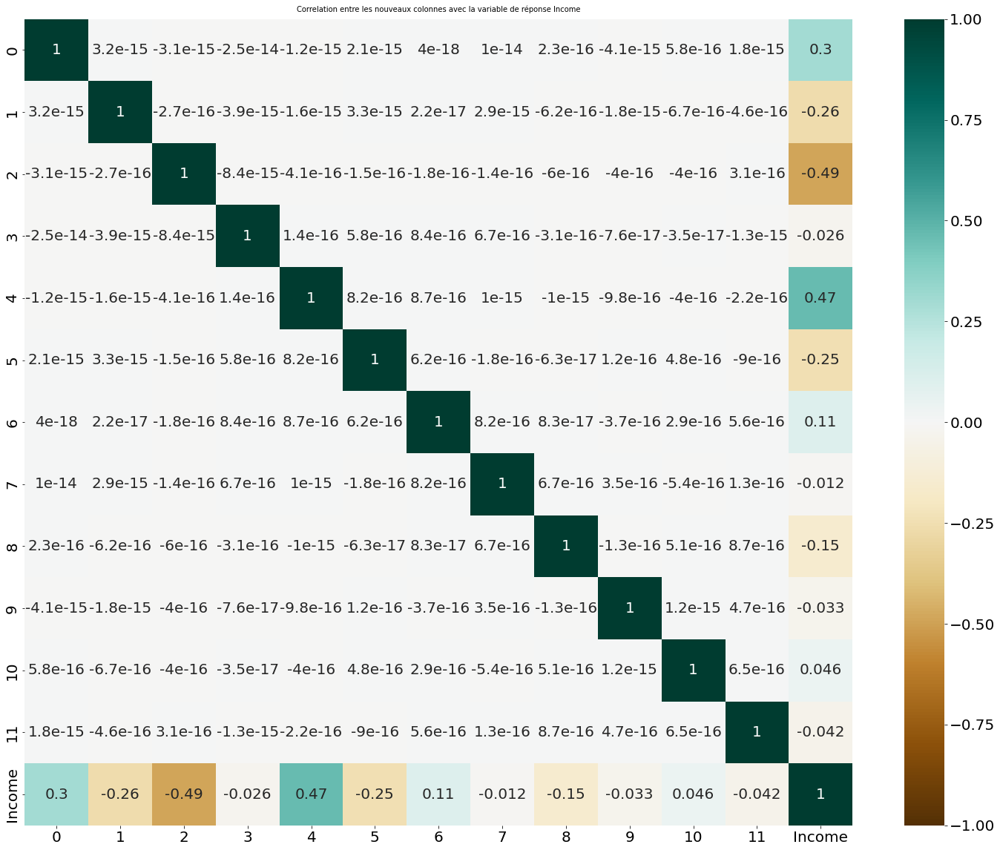

In [318]:
plt.figure(figsize=(25,20)) 

ax = sns.heatmap(reduced_dataframe.corr(), vmin=-1, vmax=1,  cmap='BrBG',annot=True)
ax.figure.axes[-1].yaxis.label.set_size(30)
ax.set_title('Correlation entre les nouveaux colonnes avec la variable de réponse Income', fontdict={'fontsize':10}, pad=10)

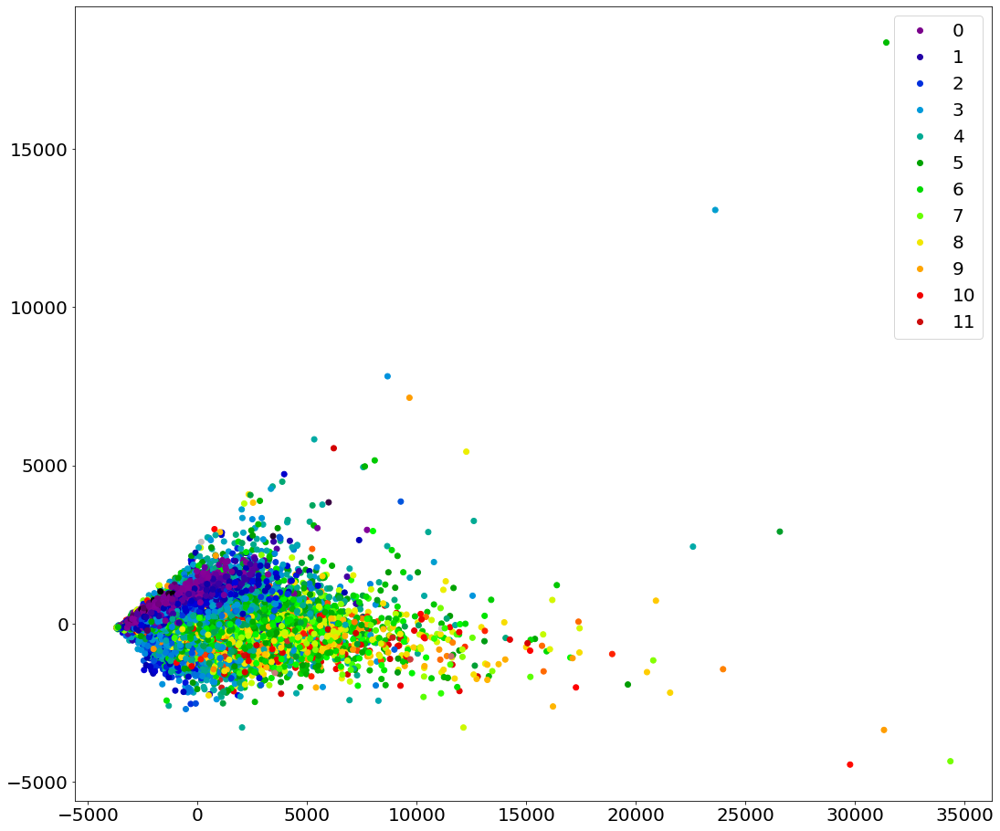

In [346]:
plt.figure(figsize=(18,16))
plot = plt.scatter(reduced_data[:,0], reduced_data[:,1], c=y, cmap='nipy_spectral')
plt.legend(handles=plot.legend_elements()[0],loc='upper right', labels=['0','1','2','3','4','5','6','7','8','9','10','11'])
plt.show()

In [320]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(reduced_data, y, test_size=0.15, random_state=30) #division des données en données de test et d'entrainement
X_train2 = sm.add_constant(X_train2)
X_test2 = sm.add_constant(X_test2)

In [321]:
model2 = sm.OLS(y_train2,X_train2).fit() #entrainer le modele
y_pred2 = model2.predict(X_test2)

In [322]:

n4 = np.log(np.sqrt(mean_squared_error(y_test2,y_pred2)))
print("Root Mean Squared Log Error(RMSLE)  est :",n4)


Root Mean Squared Log Error(RMSLE)  est : 9.456351090840718


In [323]:
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Income   R-squared:                       0.720
Model:                            OLS   Adj. R-squared:                  0.720
Method:                 Least Squares   F-statistic:                 1.272e+04
Date:                Fri, 23 Dec 2022   Prob (F-statistic):               0.00
Time:                        19:39:11   Log-Likelihood:            -6.4522e+05
No. Observations:               59358   AIC:                         1.290e+06
Df Residuals:                   59345   BIC:                         1.291e+06
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        5.73e+04     52.217   1097.343      0.000    5.72e+04    5.74e+04
x1             3.9849      0.029    139.392      0.000       3.929       4.041
x2           -14.7120      0.124   -118.932      0.000     -14.955     -14.470
x3          -297.5729      1.313   -226.616      0.000    -300.147    -294.999
x4           -25.8757      2.204    -11.741      0.000     -30.195     -21.556
x5           597.0072      2.788    214.159      0.000     591.543     602.471
x6          -364.9055      3.196   -114.193      0.000    -371.169    -358.642
x7           217.5963      4.506     48.290      0.000     208.764     226.428
x8           -28.2212      5.657     -4.989      0.000     -39.309     -17.133
x9          -472.8923      6.842    -69.121      0.000    -486.302    -459.483
x10         -115.8458      7.506    -15.434      0.000    -130.558    -101.134
x11          166.0407      7.861     21.123      0.000     150.634     181.448
x12         -177.2834      9.048    -19.595      0.000    -195.017    -159.550
==============================================================================
Omnibus:                     2904.519   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4437.139
Skew:                           0.437   Prob(JB):                         0.00
Kurtosis:                       4.015   Cond. No.                     1.83e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.83e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Classification du niveau de la pauvreté

In [324]:
df10 =df.copy() 
df10.loc[df10["Poverty"] <= 25, "Poverty"] = 0 #de 0 à 25 % --> NIVEAU LOW
df10.loc[((df10["Poverty"] > 25) & (df10["Poverty"] <= 50)), "Poverty"] = 1 #de 25 à 50 % --> NIVEAU MEDIUM
df10.loc[((df10["Poverty"] > 50) & (df10["Poverty"] <= 75)), "Poverty"] = 2 #de 50 à 75 % --> NIVEAU HIGH
df10.loc[((df10["Poverty"] > 75) & (df10["Poverty"] <= 100)), "Poverty"] = 3 #de 75 à 100 % --> NIVEAU EXTREME

In [325]:
X10 = df10.drop('Poverty',axis=1) #les variables explicatives
y10 = df10['Poverty'] #variable de réponse

In [326]:
mutual_info = mutual_info_classif(X10, y10) #utilisation du gain d'information pour séléctionner les meilleurs attributs pour la classification
mutual_info

array([0.04596118, 0.10527052, 0.06760117, 0.00701283, 0.03268062,
       0.32622133, 0.33447344, 0.10337984, 0.10745043, 0.01113443,
       0.00935254, 0.02244116, 0.04769381, 0.02592862, 0.02756693,
       0.03672842, 0.02193265, 0.03177531, 0.00899717, 0.05317705,
       0.01409675, 0.0173813 , 0.01672871, 0.00815911, 0.13465061,
       0.02038037])

In [327]:
mutual_info = pd.Series(mutual_info) #les scores de l'information gain
mutual_info.index = X10.columns
mutual_info.sort_values(ascending=False)

ChildPoverty        0.334473
Income              0.326221
Unemployment        0.134651
Service             0.107450
White               0.105271
Professional        0.103380
Black               0.067601
Employed            0.053177
Drive               0.047694
Hispanic            0.045961
Walk                0.036728
VotingAgeCitizen    0.032681
WorkAtHome          0.031775
Transit             0.027567
Carpool             0.025929
Production          0.022441
OtherTransp         0.021933
OtherRace           0.020380
PublicWork          0.017381
SelfEmployed        0.016729
PrivateWork         0.014097
Office              0.011134
Construction        0.009353
MeanCommute         0.008997
FamilyWork          0.008159
Native              0.007013
dtype: float64

<AxesSubplot:>

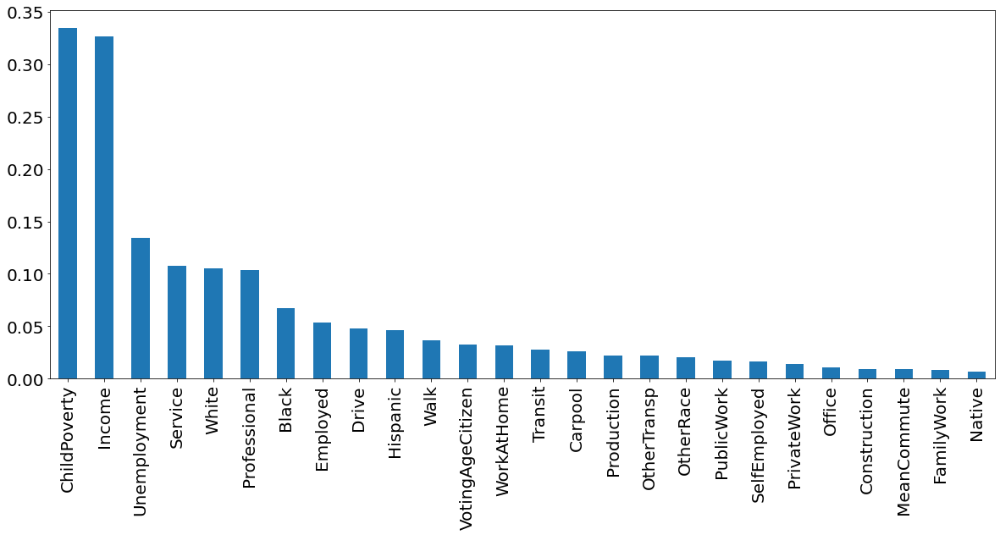

In [328]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8)) #les dix 10 meilleurs attributs


In [329]:
sel_best_feauture = SelectKBest(mutual_info_classif, k=10) #afficher les 10 meilleurs attributs pour faire la classification
sel_best_feauture.fit(X10, y10)
X10.columns[sel_best_feauture.get_support()]

Index(['Hispanic', 'White', 'Black', 'Income', 'ChildPoverty', 'Professional',
       'Service', 'Drive', 'Employed', 'Unemployment'],
      dtype='object')

In [330]:
X10 =  X10[['Unemployment', 'Employed','Drive','Service','Professional','ChildPoverty','Income','Black','White','Hispanic']] #garder juste les colonnes pertinentes

In [331]:
X_train10,X_test10,y_train10,y_test10=train_test_split(X10,y10, test_size=0.2,random_state=30) #faire le split avec 20% pour les données de test

In [332]:
clf = RandomForestClassifier() 
clf.fit(X_train10, y_train10) #entrainer le modéle de random forest

RandomForestClassifier()

In [333]:
y_pred10 = clf.predict(X_test10) #faire la prédiction

In [334]:
print("Exatitude: ", metrics.accuracy_score(y_test10, y_pred10)) #accuracy

Exatitude:  0.9391422639077827


In [335]:
report = classification_report(y_test10, y_pred10, labels=[0,1,2,3], target_names=["low", "Medium", "High","Extreme"])#rapport de classification
print(report)

              precision    recall  f1-score   support

         low       0.96      0.98      0.97     11173
      Medium       0.84      0.82      0.83      2475
        High       0.80      0.67      0.72       299
     Extreme       0.83      0.25      0.38        20

    accuracy                           0.94     13967
   macro avg       0.86      0.68      0.73     13967
weighted avg       0.94      0.94      0.94     13967



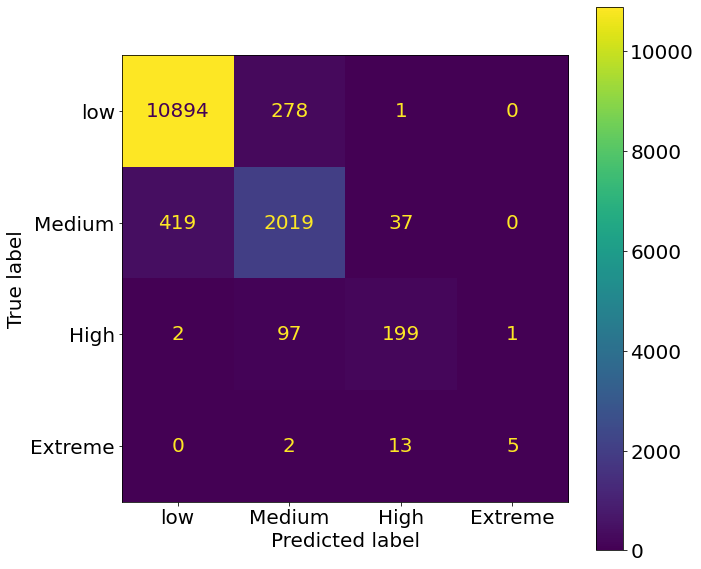

In [336]:

confusion_matrix = metrics.confusion_matrix(y_test10, y_pred10) #matrice de corrélation
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ["low", "Medium", "High","Extreme"])

fig, ax = plt.subplots(figsize=(10,10))
cm_display.plot(ax=ax)